# <center> Кластеризация изображений транспортных средств

## Постановка задачи

<center> <img src=https://i.ibb.co/t8DvkyB/smart-city-image-1.jpg align="right" width="300"/> </center>
<center> <img src=https://i.ibb.co/qYkWNVh/smart-city-image-3.jpg align="right" width="300"/> </center>


Один из ключевых проектов IntelliVision — Smart City/Transportation, система, обеспечивающая безопасность дорожного движения и более эффективную работу парковок. С помощью Smart City/Transportation можно контролировать сигналы светофоров и соблюдение ограничений скорости, определять виды транспортных средств, распознавать номерные знаки, считать автомобили и людей.

В основе всех перечисленных возможностей проекта лежит CV (Computer Vision, компьютерное зрение). Чтобы их реализовать, компания использует модели, для обучения которых применяются огромные размеченные датасеты с изображениями транспортных средств. Однако система работает в режиме реального времени и с каждым днём данных становится всё больше. Алгоритм нуждается в постоянной модернизации и должен учитывать множество факторов.

Для модификации и повышения эффективности системы Smart City/Transportation команде необходимо автоматизировать определение дополнительных параметров авто на изображении:

* тип автомобиля (кузова),
* ракурс снимка (вид сзади/спереди),
* цвет автомобиля,
* другие характеристики.

Также необходимо автоматизировать поиск выбросов в данных (засветы и блики на изображениях, изображения, на которых отсутствуют автомобили и т. д.).

К сожалению, у компании нет комплексной модели, которая могла бы одновременно находить на изображении автомобиль и определять все нужные параметры. Её нужно построить, однако многокомпонентная разметка новых данных по всем этим параметрам — очень трудозатратное занятие, которое стоит больших денег.

При решении задачи разметки данных у команды возникла гипотеза, которая нуждается в исследовании.


**Гипотеза:** разметку исходных данных можно эффективно провести с помощью методов кластеризации. 


**В чём идея?**

*Давайте будем использовать небольшой набор моделей свёрточных нейронных сетей, обученных на различных датасетах и решающих различные задачи от классификации изображений по цвету до классификации типов транспортных средств, пропустим нашу базу изображений через каждую модель, но возьмём не выходной результат модели, а только промежуточное представление признаков (дескриптор), полученное на свёрточных слоях сети.*

*Выполним такую операцию для всех изображений из набора данных, на основе полученных дескрипторов кластеризуем изображения, проинтерпретируем полученные кластеры и попробуем найти в них необходимую информацию.*

Теперь, когда мы обсудили гипотезу, перейдём к постановке задачи.

<center> <img src=https://i.ibb.co/hLcBpZF/2023-03-27-12-11-17.png align="right" width="500"/> </center>

У вас будет набор из 416 314 изображений транспортных средств различных типов, цветов и снятых с разных ракурсов.

Команда IntelliVision уже обработала свой набор данных с помощью нескольких моделей глубокого обучения (свёрточных нейронных сетей) и получила четыре варианта вектора признаков (дескрипторов) для каждого изображения.

**Ваша задача** — используя готовые дескрипторы, разбить изображения на кластеры и проинтерпретировать каждый из них. Для всех вариантов дескрипторов нужно применить несколько алгоритмов кластеризации и сравнить полученные результаты. Сравнивать можно на основе метрик, визуализаций плотностей кластеров и по тому, насколько хорошо интерпретируются кластеры.

Дополнительная подзадача — найти выбросы среди изображений. Это могут быть изображения плохого качества, изображения с бликами или изображения, на которых нет транспортных средств и т. д.

Бизнес-задача: исследовать возможность применения алгоритмов кластеризации для разметки новых данных и поиска выбросов.

Техническая задача для вас как для специалиста в Data Science: построить модель кластеризации изображений на основе дескрипторов, выделяемых с помощью различных архитектур нейронных сетей, проинтерпретировать полученные результаты и выбрать модель или комбинацию моделей, которая выделяет наиболее пригодные для интерпретации признаки.

**Ваши основные цели:**
1. Для каждого типа дескрипторов необходимо:
    * выполнить предобработку дескрипторов;
    * произвести кластеризацию изображений на основе их дескрипторов, подобрав алгоритм и параметры кластеризации;
    * сделать визуализацию полученных кластеров в 2D- или 3D-пространстве;
    * проинтерпретировать полученные кластеры — в паре предложений сформулировать, какие изображения попали в каждый из кластеров.
2. Сравнить между собой полученные кластеризации для каждого типа дескрипторов (по метрикам, визуализации и результатам интерпретации).
3. Выполнить автоматизированный поиск выбросов среди изображений на основе дескрипторов.
4. Дополнительная задача (не оценивается): попробовать воспользоваться смесью дескрипторов, полученных различными моделями, и проинтерпретировать полученные результаты.

**Примечание.** При выборе алгоритма кластеризации следует ориентироваться на внутренние метрики, а именно на индекс Калински — Харабаса (`calinski_harabasz_score`) и индекс Дэвиса — Болдина (`davies_bouldin_score`), а также на интерпретируемость кластеров и визуализацию.

## Данные и их описание

Исходная папка с данными имеет следующую структуру:

```
IntelliVision_case
├─descriptors
    └─efficientnet-b7.pickle
    └─osnet.pickle
    └─vdc_color.pickle
    └─vdc_type.pickle
├─row_data
    └─veriwild.zip
├─images_paths.csv 
```

Давайте разберёмся в ней:

* В папке `descriptors` содержатся дескрипторы, полученные для каждого из изображений с помощью соответствующих нейронных сетей, в формате numpy-массивов, сохранённых в файлах pickle:
    * `efficientnet-b7.pickle` — дескрипторы, выделенные моделью классификации с архитектурой EfficientNet версии 7. Эта модель является свёрточной нейронной сетью, предобученной на на датасете ImageNet, в котором содержатся изображения более 1000 различных классов. Эта модель при обучении не видела датасета veriwiId. 

    * `osnet.pickle` — дескрипторы, выделенные моделью OSNet, обученной для детектирования людей, животных и машин. Модель не обучалась на исходном датасете veriwiId.

    * `vdc_color.pickle` — дескрипторы, выделенные моделью регрессии для определения цвета транспортных средств в формате RGB. Частично обучена на исходном датасете veriwild.
    
    * `vdc_type.pickle` — дескрипторы, выделенные моделью классификации транспортных средств по типу на десяти классах. Частично обучена на исходном датасете veriwild.

* В папке `row_data` содержится zip-архив с исходными изображениями автомобилей. Распакуйте его содержимое в папку row_data. Архив содержит десять папок с изображениями, пронумерованных от 1 до 10. Каждая папка содержит подпапки, обозначенные пятизначными цифрами, например 36191. 

В каждой из таких подпапок содержатся фотографии одного конкретного автомобиля с разных ракурсов, снятые с помощью дорожных видеокамер.

* В файле `images_paths.csv` представлен список из полных путей до изображений. Он пригодится вам при анализе изображений, попавших в определённый кластер.


Импорт библиотек:

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import os

from sklearn.manifold import TSNE
from sklearn.cluster import MiniBatchKMeans, AgglomerativeClustering, SpectralClustering
from sklearn.mixture import GaussianMixture
from hdbscan import HDBSCAN
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score

# Кастомные функции для удобства работы с проектом
from functions import (
    load_descriptors,
    get_descriptor_length,
    clustering_evaluation,
    save_descriptors,
    perform_pca_and_save_df,
    split_and_save_filtered_columns,
    plot_samples_images,
    plot_outliers,
    dataset_overview
)

warnings.filterwarnings("ignore")
plt.rcParams["patch.force_edgecolor"] = True

## 0. Загрузка, создание и сохранение датасетов 

Примечание: Этот пункт может выполняться достаточно долго и выполняется один раз за проект, чтобы создать датасеты сохранив их в папку проекта Data.

In [2]:
# Загрузка путей к изображениям
paths_df = pd.read_csv('Data/images_paths.csv')
SAVE_FOLDER = 'Data/Init/'
os.makedirs(SAVE_FOLDER, exist_ok=True)

# Словарь с названиями и путями к pickle-файлам дескрипторов
descriptor_paths = {
    'efficientnet': 'Data/descriptors/efficientnet-b7.pickle',
    'osnet': 'Data/descriptors/osnet.pickle',
    'vdc_color': 'Data/descriptors/vdc_color.pickle',
    'vdc_type': 'Data/descriptors/vdc_type.pickle',
}

# Загрузка, упаковка в DataFrame и сохранение
for name, path in descriptor_paths.items():
    descriptors = load_descriptors(path)
    df = pd.DataFrame({
        'image_path': paths_df['paths'],
        'features': list(descriptors)
    })
    df.to_pickle(f'{SAVE_FOLDER}df_{name}.pkl')

print('Датасеты успешно сохранены!')

Датасеты успешно сохранены!


## 1. Знакомство со структурой данных

Прочитаем numpy-массивы из предоставленных pickle-файлов.

**Примечание** Для удобства дальнейшей работы составим четыре DataFrame с путями до изображений и соответствующими им дескрипторами.

Смотрим на размерности каждой из четырёх заданных матриц и сравниваем использованные модели глубокого обучения по размерностям выходных дескрипторов изображений.

In [3]:
df_efficientnet = load_descriptors('Data/Init/df_efficientnet.pkl')
df_osnet = load_descriptors('Data/Init/df_osnet.pkl')
df_vdc_color = load_descriptors('Data/Init/df_vdc_color.pkl')
df_vdc_type = load_descriptors('Data/Init/df_vdc_type.pkl')

get_descriptor_length(df_efficientnet, 'efficientnet')
get_descriptor_length(df_osnet, 'osnet')
get_descriptor_length(df_vdc_color, 'vdc_color')
get_descriptor_length(df_vdc_type, 'vdc_type')

display(df_efficientnet.head(5))
display(df_osnet.head(5))
display(df_vdc_color.head(5))
display(df_vdc_type.head(5))

efficientnet: длина дескриптора = 2560
----------------------------------------
osnet: длина дескриптора = 512
----------------------------------------
vdc_color: длина дескриптора = 128
----------------------------------------
vdc_type: длина дескриптора = 512
----------------------------------------


,image_path,features
0,veriwild\1\00001\000001.jpg,"[0.07503103, 0.31044954, 0.27607426, -0.093754..."
1,veriwild\1\00001\000002.jpg,"[0.10779837, -0.09006837, 0.46310857, 0.050939..."
2,veriwild\1\00001\000003.jpg,"[0.13423096, 0.052165277, -0.06171756, -0.0121..."
3,veriwild\1\00001\000004.jpg,"[0.028040024, 0.25177845, -0.13154922, -0.1453..."
4,veriwild\1\00001\000005.jpg,"[0.14294054, -0.13410813, 0.15225166, 0.297183..."


,image_path,features
0,veriwild\1\00001\000001.jpg,"[0.0, 0.0, 0.0, 5.33299e-40, 1.299415, 4.48213..."
1,veriwild\1\00001\000002.jpg,"[0.0, 0.0, 0.0, 5.33299e-40, 1.2090728, 5.1453..."
2,veriwild\1\00001\000003.jpg,"[0.0, 0.0, 0.0, 5.33299e-40, 8.678436e-05, 1.8..."
3,veriwild\1\00001\000004.jpg,"[0.0, 0.0, 0.0, 5.33299e-40, 1.0485553, 3.8501..."
4,veriwild\1\00001\000005.jpg,"[0.0, 0.0, 0.0, 5.33299e-40, 0.0, 1.6277972, 1..."


,image_path,features
0,veriwild\1\00001\000001.jpg,"[-0.9374271, -0.054721322, 0.596811, -0.917960..."
1,veriwild\1\00001\000002.jpg,"[-0.57900274, 0.074468166, 0.80651325, -1.0844..."
2,veriwild\1\00001\000003.jpg,"[-0.58707464, -0.48330888, 0.7987211, -0.81161..."
3,veriwild\1\00001\000004.jpg,"[-0.87896514, -0.1271264, 0.7801766, -0.883755..."
4,veriwild\1\00001\000005.jpg,"[-0.57456505, -0.5040994, 0.895725, -0.6989022..."


,image_path,features
0,veriwild\1\00001\000001.jpg,"[0.025641812, 0.0020084875, 0.14198549, 0.2350..."
1,veriwild\1\00001\000002.jpg,"[0.008059538, 0.0, 0.13719751, 0.2776476, 0.11..."
2,veriwild\1\00001\000003.jpg,"[0.030589718, 0.037743706, 0.01926565, 0.10890..."
3,veriwild\1\00001\000004.jpg,"[0.0043461104, 0.0, 0.13767008, 0.29437226, 0...."
4,veriwild\1\00001\000005.jpg,"[0.035803735, 0.01425204, 0.051390205, 0.07954..."


## Вывод:

На основе полученной информации о собранных датасетах можно сделать предварительные выводы:

- EfficientNet даёт наибольшую информативность (2560 признаков), но может быть не адаптирована к задаче (возмжно необходимо снижение размерности).

- OSNet и VDC Type — сбалансированы по размерности и подходят классификации транспортных средств.

- VDC Color — полезен как цветовая фильтрация, например, в начале пайплайна сравнения.

## 2. Преобразование, очистка и анализ данных

Признаки, найденные с помощью некоторых моделей, исчисляются тысячами, что довольно много, учитывая общее количество наблюдений.

В данном случае производить кластеризацию на таком большом количестве признаков, сформированных исходными моделями глубокого обучения, довольно сложно и затратно по времени. К тому же многие признаки, найденные моделями на изображениях, могут быть сильно скоррелированы между собой.

Понизим размерность исходных дескрипторов с помощью соответствующих методов. Уменьшим размерность входных данных до 100 или 200 признаков — этого будет достаточно, чтобы произвести кластеризацию, однако попробуем самостоятельно подобрать необходимое количество компонент в новом пространстве признаков.

Также позаботимся о масштабе признаков, воспользовавшись стандартизацией и нормализацией и маштабированием. После кластеризации определим, какой вариант масштабирования более успешен для каждого варианта дескрипторов.

### Cтандартизация, нормализация и маштабирование для каждого дескриптора

In [4]:
descriptors = {
    "efficientnet": df_efficientnet,
    "osnet": df_osnet,
    "vdc_type": df_vdc_type,
    "vdc_color": df_vdc_color
}

for desc_name, df in descriptors.items():
    print(f"\n=== Обработка дескриптора: {desc_name} ===")
    
    X = np.vstack(df['features'].values)
    
    # StandardScaler
    pipeline_std = Pipeline([('scaler', StandardScaler())])
    X_standard_scaled = pipeline_std.fit_transform(X)
    df['standard_scaled'] = list(X_standard_scaled)
    print(f"- StandardScaler готово: {X_standard_scaled.shape}")
    
    # MinMaxScaler
    pipeline_minmax = Pipeline([('scaler', MinMaxScaler())])
    X_minmax_scaled = pipeline_minmax.fit_transform(X)
    df['minmax_scaled'] = list(X_minmax_scaled)
    print(f"- MinMaxScaler готово: {X_minmax_scaled.shape}")
    
    # RobustScaler
    pipeline_robust = Pipeline([('scaler', RobustScaler())])
    X_robust_scaled = pipeline_robust.fit_transform(X)
    df['robust_scaled'] = list(X_robust_scaled)
    print(f"- RobustScaler готово: {X_robust_scaled.shape}")
    
    # Сохраняем каждый df в отдельный файл
    save_descriptors(df, f'scaled_{desc_name}', save_folder='Data/Scaled/')


=== Обработка дескриптора: efficientnet ===
- StandardScaler готово: (416314, 2560)
- MinMaxScaler готово: (416314, 2560)
- RobustScaler готово: (416314, 2560)
===> Сохранено: Data/Scaled/scaled_efficientnet.pkl

=== Обработка дескриптора: osnet ===
- StandardScaler готово: (416314, 512)
- MinMaxScaler готово: (416314, 512)
- RobustScaler готово: (416314, 512)
===> Сохранено: Data/Scaled/scaled_osnet.pkl

=== Обработка дескриптора: vdc_type ===
- StandardScaler готово: (416314, 512)
- MinMaxScaler готово: (416314, 512)
- RobustScaler готово: (416314, 512)
===> Сохранено: Data/Scaled/scaled_vdc_type.pkl

=== Обработка дескриптора: vdc_color ===
- StandardScaler готово: (416314, 128)
- MinMaxScaler готово: (416314, 128)
- RobustScaler готово: (416314, 128)
===> Сохранено: Data/Scaled/scaled_vdc_color.pkl


In [5]:
scaled_efficientnet = load_descriptors('Data/Scaled/scaled_efficientnet.pkl')
scaled_osnet = load_descriptors('Data/Scaled/scaled_osnet.pkl')
scaled_vdc_color = load_descriptors('Data/Scaled/scaled_vdc_color.pkl')
scaled_vdc_type = load_descriptors('Data/Scaled/scaled_vdc_type.pkl')

In [6]:
display(scaled_efficientnet.head(2))
display(scaled_osnet.head(2))
display(scaled_vdc_color.head(2))
display(scaled_vdc_type.head(2))

,image_path,features,standard_scaled,minmax_scaled,robust_scaled
0,veriwild\1\00001\000001.jpg,"[0.07503103, 0.31044954, 0.27607426, -0.093754...","[0.26668844, 1.4916874, 1.4610599, -0.7280337,...","[0.2144259, 0.3671058, 0.34486178, 0.09758417,...","[0.33972716, 1.3087536, 1.2982608, -0.39518395..."
1,veriwild\1\00001\000002.jpg,"[0.10779837, -0.09006837, 0.46310857, 0.050939...","[0.46090636, -0.6371233, 2.5825217, 0.08262409...","[0.23555721, 0.10454564, 0.46932188, 0.1879967...","[0.4845446, -0.3137935, 2.165015, 0.24501953, ..."


,image_path,features,standard_scaled,minmax_scaled,robust_scaled
0,veriwild\1\00001\000001.jpg,"[0.0, 0.0, 0.0, 5.33299e-40, 1.299415, 4.48213...","[-0.37399742, -0.48954767, -0.27019632, 0.0, 0...","[0.0, 0.0, 0.0, 0.0, 0.21539395, 0.49698338, 0...","[0.0, 0.0, 0.0, 0.0, 0.13084541, 0.6663724, 0...."
1,veriwild\1\00001\000002.jpg,"[0.0, 0.0, 0.0, 5.33299e-40, 1.2090728, 5.1453...","[-0.37399742, -0.48954767, -0.27019632, 0.0, -...","[0.0, 0.0, 0.0, 0.0, 0.20041862, 0.5705242, 0....","[0.0, 0.0, 0.0, 0.0, 0.065171525, 1.0190427, 0..."


,image_path,features,standard_scaled,minmax_scaled,robust_scaled
0,veriwild\1\00001\000001.jpg,"[-0.9374271, -0.054721322, 0.596811, -0.917960...","[-1.9667625, 0.67336184, 0.93390626, -1.523496...","[0.40897432, 0.62178004, 0.7533435, 0.462403, ...","[-1.5579681, 0.4815545, 0.53636837, -1.2085363..."
1,veriwild\1\00001\000002.jpg,"[-0.57900274, 0.074468166, 0.80651325, -1.0844...","[-0.058523227, 1.4067876, 1.3826288, -2.328854...","[0.59132147, 0.68010116, 0.80970657, 0.3874523...","[-0.0978975, 1.0583085, 0.79559666, -1.8257973..."


,image_path,features,standard_scaled,minmax_scaled,robust_scaled
0,veriwild\1\00001\000001.jpg,"[0.025641812, 0.0020084875, 0.14198549, 0.2350...","[-0.67410135, -0.65573853, 0.30239776, 0.10398...","[0.02475276, 0.0012195877, 0.062598765, 0.3300...","[-0.28214106, -0.20995587, 0.51566374, 0.05885..."
1,veriwild\1\00001\000002.jpg,"[0.008059538, 0.0, 0.13719751, 0.2776476, 0.11...","[-0.9012095, -0.6892529, 0.25500908, 0.4621223...","[0.007780098, 0.0, 0.06048783, 0.3897523, 0.05...","[-0.46645182, -0.24427913, 0.47174978, 0.30607..."


### Понижение размерности для scaled_data с помощью PCA


=== Обработка дескриптора: efficientnet ===
  PCA для standard_scaled
-> Оптимальное число компонент: 100
  PCA для minmax_scaled
-> Оптимальное число компонент: 100
  PCA для robust_scaled
-> Оптимальное число компонент: 100
===> Сохранено: Data/Scaled_PCA/pca_scaled_efficientnet.pkl

=== Обработка дескриптора: osnet ===
  PCA для standard_scaled
-> Оптимальное число компонент: 100
  PCA для minmax_scaled
-> Оптимальное число компонент: 100
  PCA для robust_scaled
-> Оптимальное число компонент: 7
===> Сохранено: Data/Scaled_PCA/pca_scaled_osnet.pkl

=== Обработка дескриптора: vdc_color ===
  PCA для standard_scaled
-> Оптимальное число компонент: 90
  PCA для minmax_scaled
-> Оптимальное число компонент: 89
  PCA для robust_scaled
-> Оптимальное число компонент: 88
===> Сохранено: Data/Scaled_PCA/pca_scaled_vdc_color.pkl

=== Обработка дескриптора: vdc_type ===
  PCA для standard_scaled
-> Оптимальное число компонент: 46


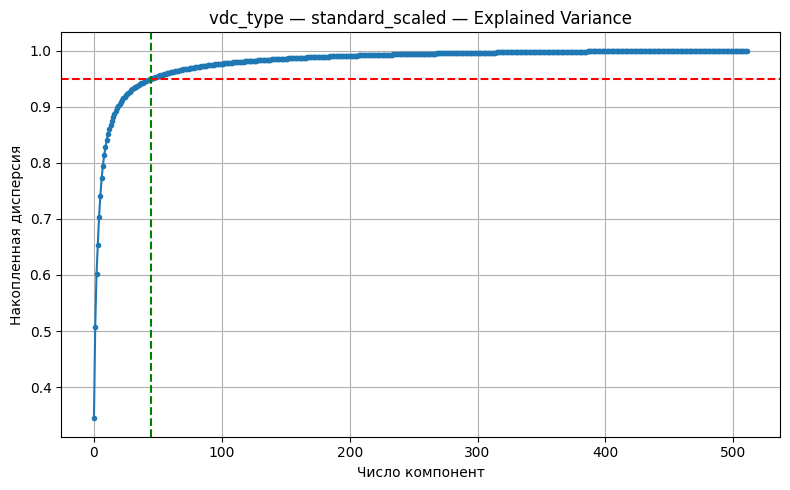

  PCA для minmax_scaled
-> Оптимальное число компонент: 37


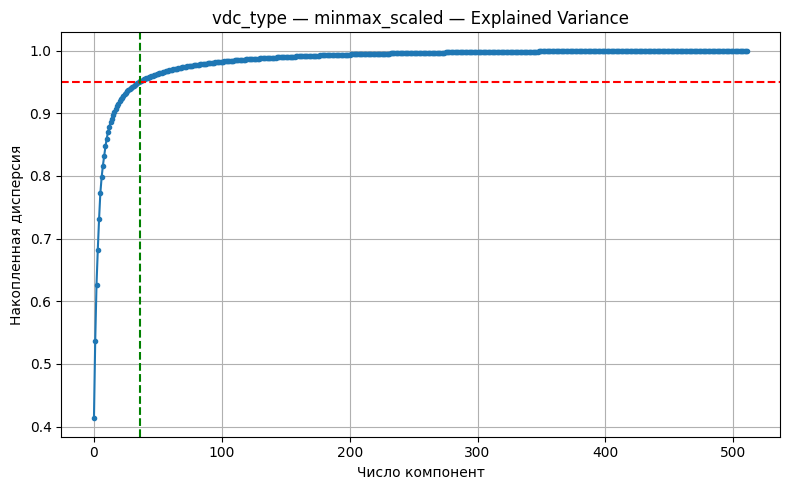

  PCA для robust_scaled
-> Оптимальное число компонент: 35


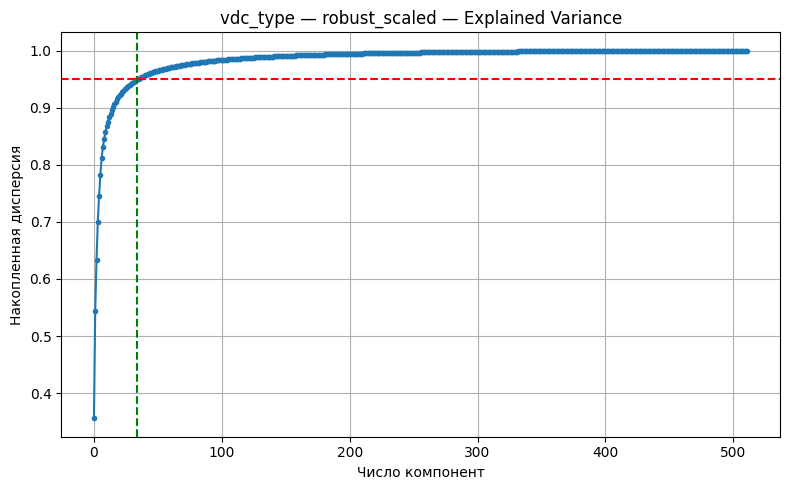

===> Сохранено: Data/Scaled_PCA/pca_scaled_vdc_type.pkl


In [7]:
SAVE_FOLDER = 'Data/Scaled_PCA/'
THRESHOLD = 0.95
DRAW_PLOTS = False
MAX_COMPONENTS = 100
os.makedirs(SAVE_FOLDER, exist_ok=True)

perform_pca_and_save_df(
    scaled_efficientnet, 
    desc_name='efficientnet', 
    save_folder=SAVE_FOLDER,
    explained_variance_threshold=THRESHOLD,
    draw_plots=DRAW_PLOTS,
    max_components=MAX_COMPONENTS
)
perform_pca_and_save_df(
    scaled_osnet, 
    desc_name='osnet', 
    save_folder=SAVE_FOLDER,
    explained_variance_threshold=THRESHOLD,
    draw_plots=DRAW_PLOTS,
    max_components=MAX_COMPONENTS
)
perform_pca_and_save_df(
    scaled_vdc_color, 
    desc_name='vdc_color', 
    save_folder=SAVE_FOLDER,
    explained_variance_threshold=THRESHOLD,
    draw_plots=DRAW_PLOTS,
    max_components=MAX_COMPONENTS
)
perform_pca_and_save_df(
    scaled_vdc_type,
    desc_name='vdc_type',
    save_folder=SAVE_FOLDER,
    explained_variance_threshold=THRESHOLD,
    draw_plots=True,
    max_components=MAX_COMPONENTS
)

In [2]:
pca_scaled_efficientnet = load_descriptors('Data/Scaled_PCA/pca_scaled_efficientnet.pkl')
pca_scaled_osnet = load_descriptors('Data/Scaled_PCA/pca_scaled_osnet.pkl')
pca_scaled_vdc_color = load_descriptors('Data/Scaled_PCA/pca_scaled_vdc_color.pkl')
pca_scaled_vdc_type = load_descriptors('Data/Scaled_PCA/pca_scaled_vdc_type.pkl')

In [3]:
display(pca_scaled_efficientnet.head(2))
display(pca_scaled_osnet.head(2))
display(pca_scaled_vdc_color.head(2))
display(pca_scaled_vdc_type.head(2))

,image_path,features,standard_scaled,minmax_scaled,robust_scaled,pca_standard_scaled,pca_minmax_scaled,pca_robust_scaled
0,veriwild\1\00001\000001.jpg,"[0.07503103, 0.31044954, 0.27607426, -0.093754...","[0.26668844, 1.4916874, 1.4610599, -0.7280337,...","[0.2144259, 0.3671058, 0.34486178, 0.09758417,...","[0.33972716, 1.3087536, 1.2982608, -0.39518395...","[-6.3925276, -8.032503, -5.1691413, 6.088857, ...","[-0.7507498, 0.9072448, 0.6229113, 0.6778529, ...","[-4.8200326, 6.185469, -3.7890584, 4.79172, -0..."
1,veriwild\1\00001\000002.jpg,"[0.10779837, -0.09006837, 0.46310857, 0.050939...","[0.46090636, -0.6371233, 2.5825217, 0.08262409...","[0.23555721, 0.10454564, 0.46932188, 0.1879967...","[0.4845446, -0.3137935, 2.165015, 0.24501953, ...","[0.11269047, -6.681322, -8.27425, 2.983706, -7...","[0.037817754, 0.7610679, 0.9609314, 0.31492388...","[0.07121316, 5.1648097, -6.2292476, 2.5668344,..."


,image_path,features,standard_scaled,minmax_scaled,robust_scaled,pca_standard_scaled,pca_minmax_scaled,pca_robust_scaled
0,veriwild\1\00001\000001.jpg,"[0.0, 0.0, 0.0, 5.33299e-40, 1.299415, 4.48213...","[-0.37399742, -0.48954767, -0.27019632, 0.0, 0...","[0.0, 0.0, 0.0, 0.0, 0.21539395, 0.49698338, 0...","[0.0, 0.0, 0.0, 0.0, 0.13084541, 0.6663724, 0....","[8.894403, -3.8836393, 0.43534556, 0.2752684, ...","[1.2609524, -0.3279701, -0.3085305, -0.1542544...","[-47.03444, 46.07119, -18.381063, -9.60357, -4..."
1,veriwild\1\00001\000002.jpg,"[0.0, 0.0, 0.0, 5.33299e-40, 1.2090728, 5.1453...","[-0.37399742, -0.48954767, -0.27019632, 0.0, -...","[0.0, 0.0, 0.0, 0.0, 0.20041862, 0.5705242, 0....","[0.0, 0.0, 0.0, 0.0, 0.065171525, 1.0190427, 0...","[10.033642, -10.559716, -1.3510345, -0.6073957...","[1.575796, -0.82183206, -0.8663821, -0.3736832...","[-57.52702, 260.12463, -17.010658, -7.9755044,..."


,image_path,features,standard_scaled,minmax_scaled,robust_scaled,pca_standard_scaled,pca_minmax_scaled,pca_robust_scaled
0,veriwild\1\00001\000001.jpg,"[-0.9374271, -0.054721322, 0.596811, -0.917960...","[-1.9667625, 0.67336184, 0.93390626, -1.523496...","[0.40897432, 0.62178004, 0.7533435, 0.462403, ...","[-1.5579681, 0.4815545, 0.53636837, -1.2085363...","[6.9733, 2.000757, 0.63541955, -0.8997971, 0.5...","[0.7752067, 0.12029028, 0.027938724, -0.108644...","[-4.3691072, -2.5933166, 1.1048768, -0.5764568..."
1,veriwild\1\00001\000002.jpg,"[-0.57900274, 0.074468166, 0.80651325, -1.0844...","[-0.058523227, 1.4067876, 1.3826288, -2.328854...","[0.59132147, 0.68010116, 0.80970657, 0.3874523...","[-0.0978975, 1.0583085, 0.79559666, -1.8257973...","[10.330031, -3.516619, -1.5414491, -2.2678578,...","[1.0860487, -0.43857765, -0.13115835, -0.22322...","[-8.018008, 0.34595427, -1.0952781, -1.7022216..."


,image_path,features,standard_scaled,minmax_scaled,robust_scaled,pca_standard_scaled,pca_minmax_scaled,pca_robust_scaled
0,veriwild\1\00001\000001.jpg,"[0.025641812, 0.0020084875, 0.14198549, 0.2350...","[-0.67410135, -0.65573853, 0.30239776, 0.10398...","[0.02475276, 0.0012195877, 0.062598765, 0.3300...","[-0.28214106, -0.20995587, 0.51566374, 0.05885...","[-18.531704, 6.516436, 10.038766, 1.1943146, -...","[-2.276808, -1.0124856, -0.4334498, 0.14175376...","[-5.318824, -11.911387, 7.9186993, -9.072136, ..."
1,veriwild\1\00001\000002.jpg,"[0.008059538, 0.0, 0.13719751, 0.2776476, 0.11...","[-0.9012095, -0.6892529, 0.25500908, 0.4621223...","[0.007780098, 0.0, 0.06048783, 0.3897523, 0.05...","[-0.46645182, -0.24427913, 0.47174978, 0.30607...","[-12.08005, 0.31770283, 7.8008122, -0.47288015...","[-1.5026684, -0.49099648, -0.59416443, 0.15349...","[-7.4111724, -7.241379, 5.5474443, -4.3209524,..."


### Кластеризуем уже полностью предобработанные данные

__Примечание__: Из-за ограниченных вычислительных мощностей и дабы сэкономить время при кластеризации, было решено использовать в кластеризации первые 15_000 записей (этого должно быть достаточно, для получения результатов).

### Метрика коэффициент Silhouette (чем выше, ближе к 1 — тем лучше)

In [4]:
MAX_SAMPLES = 15_000

clustering_evaluation(
    df=pca_scaled_efficientnet[:MAX_SAMPLES],
    desc_name='EfficientNet',
    cluster_model_cls=MiniBatchKMeans,
    cluster_model_params={'random_state': 42},
    k_range=range(2, 11),
    metrics=[(silhouette_score, 'silhouette_score')],
    selected_pca_cols=['pca_robust_scaled', 'pca_standard_scaled', 'pca_minmax_scaled']
)
clustering_evaluation(
    df=pca_scaled_osnet[:MAX_SAMPLES],
    desc_name='OSNet',
    cluster_model_cls=MiniBatchKMeans,
    cluster_model_params={'random_state': 42},
    k_range=range(2, 11),
    metrics=[(silhouette_score, 'silhouette_score')],
    selected_pca_cols=['pca_robust_scaled', 'pca_standard_scaled', 'pca_minmax_scaled']
)
clustering_evaluation(
    df=pca_scaled_vdc_type[:MAX_SAMPLES],
    desc_name='VDC Type',
    cluster_model_cls=MiniBatchKMeans,
    cluster_model_params={'random_state': 42},
    k_range=range(2, 11),
    metrics=[(silhouette_score, 'silhouette_score')],
    selected_pca_cols=['pca_robust_scaled', 'pca_standard_scaled', 'pca_minmax_scaled']
)
clustering_evaluation(
    df=pca_scaled_vdc_color[:MAX_SAMPLES],
    desc_name='VDC Color',
    cluster_model_cls=MiniBatchKMeans,
    cluster_model_params={'random_state': 42},
    k_range=range(2, 11),
    metrics=[(silhouette_score, 'silhouette_score')],
    selected_pca_cols=['pca_robust_scaled', 'pca_standard_scaled', 'pca_minmax_scaled']
)


=== Оценка кластеризации: EfficientNet ===

  Колонка: pca_robust_scaled
silhouette_score: Лучшее k = 2, score = 0.1471

  Колонка: pca_standard_scaled
silhouette_score: Лучшее k = 2, score = 0.1468

  Колонка: pca_minmax_scaled
silhouette_score: Лучшее k = 2, score = 0.2021

=== Оценка кластеризации: OSNet ===

  Колонка: pca_robust_scaled
silhouette_score: Лучшее k = 2, score = 0.6758

  Колонка: pca_standard_scaled
silhouette_score: Лучшее k = 2, score = 0.0906

  Колонка: pca_minmax_scaled
silhouette_score: Лучшее k = 2, score = 0.1258

=== Оценка кластеризации: VDC Type ===

  Колонка: pca_robust_scaled
silhouette_score: Лучшее k = 2, score = 0.5224

  Колонка: pca_standard_scaled
silhouette_score: Лучшее k = 2, score = 0.2522

  Колонка: pca_minmax_scaled
silhouette_score: Лучшее k = 2, score = 0.2876

=== Оценка кластеризации: VDC Color ===

  Колонка: pca_robust_scaled
silhouette_score: Лучшее k = 3, score = 0.1696

  Колонка: pca_standard_scaled
silhouette_score: Лучшее k = 3

## Вывод: 
Все значения в основном меньше 0.3, это может означать:

* Слабой структурированности кластеров,

* Сильном перекрытии между классами,

* Сложности в разделении данных на чёткие группы.

В данном случае __Silhouette Score__ может быть недостаточно информативным для части признаков (например, EfficientNet), особенно при наличии высокой размерности, линейной зависимости или неявной кластерной структуры. Cтоит проанализировать другие метрки.

## 3. Моделирование и оценка качества модели

### 3.1. Кластеризация изображений

После предобработки исходных данных произведём кластеризацию для каждого набора дескрипторов.

Для решения задачи используем несколько различных методов, подбирая оптимальное количество кластеров для каждого метода и варианта дескрипторов.

В качестве метрик для подбора оптимального количества кластеров используем внутренние меры: индекс Калински — Харабаса (`calinski_harabasz_score`) и индекс Дэвиса — Болдина (`davies_bouldin_score`).

Вынесем код для построения моделей кластеризации и подбора их параметров в отдельную функцию, чтобы не множить одинаковый код для четырёх случаев дескрипторов.

**Примечание.** Поскольку исходных данных много, могут возникнуть проблемы с оперативной памятью и скоростью работы таких алгоритмов, как K-Means. Вместо стандартного алгоритма K-Means используем реализацию MiniBatchKMeans.

**Примечание.** Постараемся написать чистый код, максимально уменьшая количество дублирующихся участков.

### Метрика Calinski-Harabasz (чем выше — тем лучше)
### Метрика Davies-Bouldin (чем ниже — тем лучше)

In [5]:
clustering_evaluation(
    df=pca_scaled_efficientnet[:MAX_SAMPLES],
    desc_name='EfficientNet',
    cluster_model_cls=MiniBatchKMeans,
    cluster_model_params={'random_state': 42},
    k_range=range(2, 11),
    metrics=[(calinski_harabasz_score, 'calinski_harabasz_score'), 
             (davies_bouldin_score, 'davies_bouldin_score')],
    selected_pca_cols=['pca_robust_scaled', 'pca_standard_scaled', 'pca_minmax_scaled']
)
clustering_evaluation(
    df=pca_scaled_osnet[:MAX_SAMPLES],
    desc_name='OSNet',
    cluster_model_cls=MiniBatchKMeans,
    cluster_model_params={'random_state': 42},
    k_range=range(2, 11),
    metrics=[(calinski_harabasz_score, 'calinski_harabasz_score'), 
             (davies_bouldin_score, 'davies_bouldin_score')],
    selected_pca_cols=['pca_robust_scaled', 'pca_standard_scaled', 'pca_minmax_scaled']
)
clustering_evaluation(
    df=pca_scaled_vdc_type[:MAX_SAMPLES],
    desc_name='VDC Type',
    cluster_model_cls=MiniBatchKMeans,
    cluster_model_params={'random_state': 42},
    k_range=range(2, 11),
    metrics=[(calinski_harabasz_score, 'calinski_harabasz_score'), 
             (davies_bouldin_score, 'davies_bouldin_score')],
    selected_pca_cols=['pca_robust_scaled', 'pca_standard_scaled', 'pca_minmax_scaled']
)
clustering_evaluation(
    df=pca_scaled_vdc_color[:MAX_SAMPLES],
    desc_name='VDC Color',
    cluster_model_cls=MiniBatchKMeans,
    cluster_model_params={'random_state': 42},
    k_range=range(2, 11),
    metrics=[(calinski_harabasz_score, 'calinski_harabasz_score'), 
             (davies_bouldin_score, 'davies_bouldin_score')],
    selected_pca_cols=['pca_robust_scaled', 'pca_standard_scaled', 'pca_minmax_scaled']
)


=== Оценка кластеризации: EfficientNet ===

  Колонка: pca_robust_scaled
calinski_harabasz_score: Лучшее k = 2, score = 1908.5922
davies_bouldin_score: Лучшее k = 2, score = 2.6252

  Колонка: pca_standard_scaled
calinski_harabasz_score: Лучшее k = 2, score = 1900.4907
davies_bouldin_score: Лучшее k = 2, score = 2.6277

  Колонка: pca_minmax_scaled
calinski_harabasz_score: Лучшее k = 2, score = 2020.9390
davies_bouldin_score: Лучшее k = 2, score = 2.1821

=== Оценка кластеризации: OSNet ===

  Колонка: pca_robust_scaled
calinski_harabasz_score: Лучшее k = 2, score = 13628.8203
davies_bouldin_score: Лучшее k = 2, score = 0.6466

  Колонка: pca_standard_scaled
calinski_harabasz_score: Лучшее k = 2, score = 1584.0736
davies_bouldin_score: Лучшее k = 2, score = 2.8681

  Колонка: pca_minmax_scaled
calinski_harabasz_score: Лучшее k = 2, score = 2291.7256
davies_bouldin_score: Лучшее k = 2, score = 2.4632

=== Оценка кластеризации: VDC Type ===

  Колонка: pca_robust_scaled
calinski_harabas

## Вывод:
Финальный набор cудя по всем трем метрика был выбран так:

* EfficientNet -> robust_scaled, количество кластеров = 2;

* OSNet -> robust_scaled, количество кластеров = 2;

* VDC Type -> robust_scaled, количество кластеров = 2;

* VDC Color -> minmax_scaled, количество кластеров = 2;

### 3.2. Интерпретация кластеров

#### 3.2.1 Визуализация кластеров

Визуализируем результаты кластеризации в двух мерном пространстве, предварительно понизив размерность дескрипторов изображений до соответствующих размерностей с помощью метода t-SNE.

По результатам визуализации кластеров сделаем предположение о качестве полученной кластеризации.

In [6]:
SAVE_FOLDER = 'Data/Scaled_PCA_Claster/'
os.makedirs(SAVE_FOLDER, exist_ok=True)

split_and_save_filtered_columns(
    df=pca_scaled_efficientnet,
    desc_name='df_clast_efficientnet',
    columns_to_remove=['pca_standard_scaled', 
                       'pca_minmax_scaled',
                       'features',
                       'standard_scaled',	
                       'minmax_scaled',	
                       'robust_scaled'
                       ], # оставляем robust
    save_folder=SAVE_FOLDER
)
split_and_save_filtered_columns(
    df=pca_scaled_osnet,
    desc_name='df_clast_osnet',
    columns_to_remove=['pca_standard_scaled', 
                       'pca_minmax_scaled',
                       'features',
                       'standard_scaled',	
                       'minmax_scaled',	
                       'robust_scaled'
                       ], # оставляем robust
    save_folder=SAVE_FOLDER
)
split_and_save_filtered_columns(
    df=pca_scaled_vdc_type,
    desc_name='df_clast_vdc_type',
    columns_to_remove=['pca_standard_scaled', 
                       'pca_minmax_scaled',
                       'features', 
                       'standard_scaled',	
                       'minmax_scaled',	
                       'robust_scaled'
                       ], # оставляем robust
    save_folder=SAVE_FOLDER
)
split_and_save_filtered_columns(
    df=pca_scaled_vdc_color,
    desc_name='df_clast_vdc_color',
    columns_to_remove=['pca_standard_scaled', 
                       'pca_robust_scaled', 
                       'features', 
                       'standard_scaled',	
                       'minmax_scaled',	
                       'robust_scaled'
                       ], # оставляем minmax
    save_folder=SAVE_FOLDER
)


=== Обработка дескриптора: df_clast_efficientnet ===
Изначально столбцов: 8
Будет удалено столбцов: ['pca_standard_scaled', 'pca_minmax_scaled', 'features', 'standard_scaled', 'minmax_scaled', 'robust_scaled']
Осталось столбцов после удаления: 2
===> Сохранено: Data/Scaled_PCA_Claster/df_clast_efficientnet.pkl

=== Обработка дескриптора: df_clast_osnet ===
Изначально столбцов: 8
Будет удалено столбцов: ['pca_standard_scaled', 'pca_minmax_scaled', 'features', 'standard_scaled', 'minmax_scaled', 'robust_scaled']
Осталось столбцов после удаления: 2
===> Сохранено: Data/Scaled_PCA_Claster/df_clast_osnet.pkl

=== Обработка дескриптора: df_clast_vdc_type ===
Изначально столбцов: 8
Будет удалено столбцов: ['pca_standard_scaled', 'pca_minmax_scaled', 'features', 'standard_scaled', 'minmax_scaled', 'robust_scaled']
Осталось столбцов после удаления: 2
===> Сохранено: Data/Scaled_PCA_Claster/df_clast_vdc_type.pkl

=== Обработка дескриптора: df_clast_vdc_color ===
Изначально столбцов: 8
Будет уда

In [7]:
# Загружаем сохраненные ранее файлы
df_clast_efficientnet = load_descriptors('Data/Scaled_PCA_Claster/df_clast_efficientnet.pkl')
df_clast_osnet = load_descriptors('Data/Scaled_PCA_Claster/df_clast_osnet.pkl')
df_clast_dc_color = load_descriptors('Data/Scaled_PCA_Claster/df_clast_vdc_color.pkl')
df_clast_vdc_type = load_descriptors('Data/Scaled_PCA_Claster/df_clast_vdc_type.pkl')

In [8]:
display(df_clast_efficientnet.head(2))
display(df_clast_osnet.head(2))
display(df_clast_dc_color.head(2))
display(df_clast_vdc_type.head(2))

,image_path,pca_robust_scaled
0,veriwild\1\00001\000001.jpg,"[-4.8200326, 6.185469, -3.7890584, 4.79172, -0..."
1,veriwild\1\00001\000002.jpg,"[0.07121316, 5.1648097, -6.2292476, 2.5668344,..."


,image_path,pca_robust_scaled
0,veriwild\1\00001\000001.jpg,"[-47.03444, 46.07119, -18.381063, -9.60357, -4..."
1,veriwild\1\00001\000002.jpg,"[-57.52702, 260.12463, -17.010658, -7.9755044,..."


,image_path,pca_minmax_scaled
0,veriwild\1\00001\000001.jpg,"[0.7752067, 0.12029028, 0.027938724, -0.108644..."
1,veriwild\1\00001\000002.jpg,"[1.0860487, -0.43857765, -0.13115835, -0.22322..."


,image_path,pca_robust_scaled
0,veriwild\1\00001\000001.jpg,"[-5.318824, -11.911387, 7.9186993, -9.072136, ..."
1,veriwild\1\00001\000002.jpg,"[-7.4111724, -7.241379, 5.5474443, -4.3209524,..."



Обработка дескриптора: EfficientNet
Используем колонку: pca_robust_scaled
Кластеризация с MiniBatchKMeans


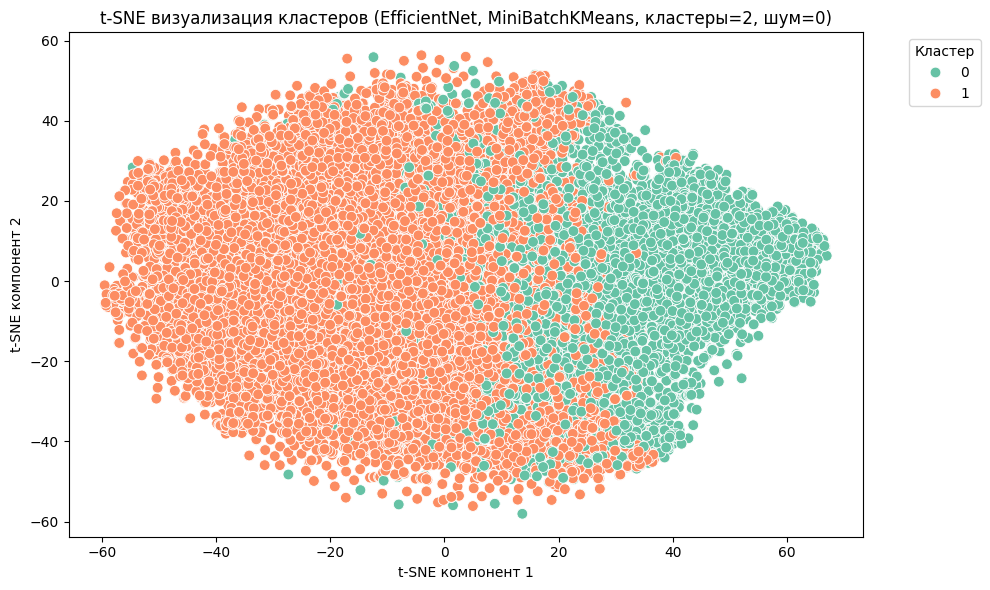

===> Добавлен столбец: cluster_MiniBatchKMeans
Кластеризация с GaussianMixture


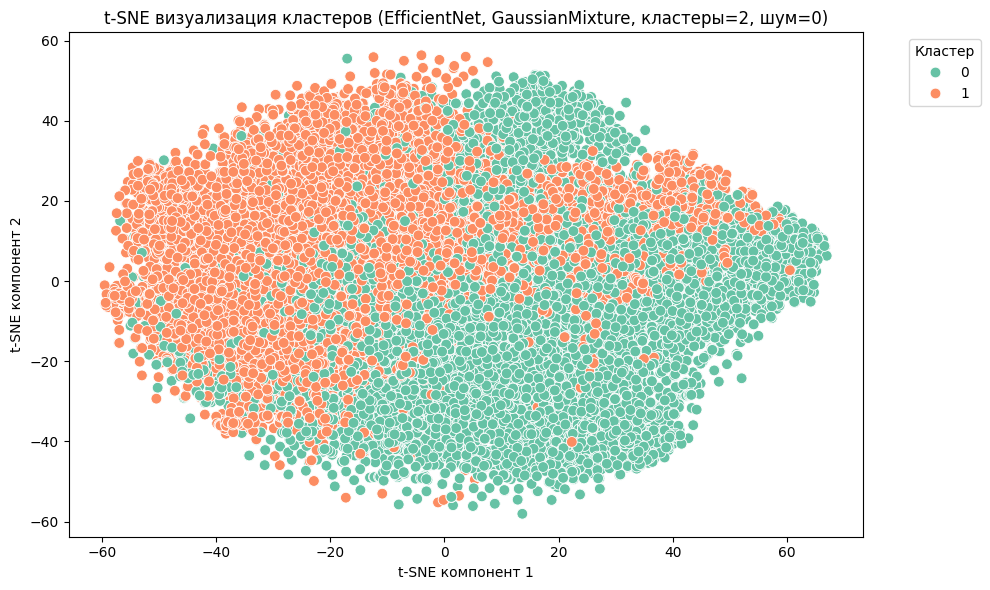

===> Добавлен столбец: cluster_GaussianMixture
Кластеризация с AgglomerativeClustering


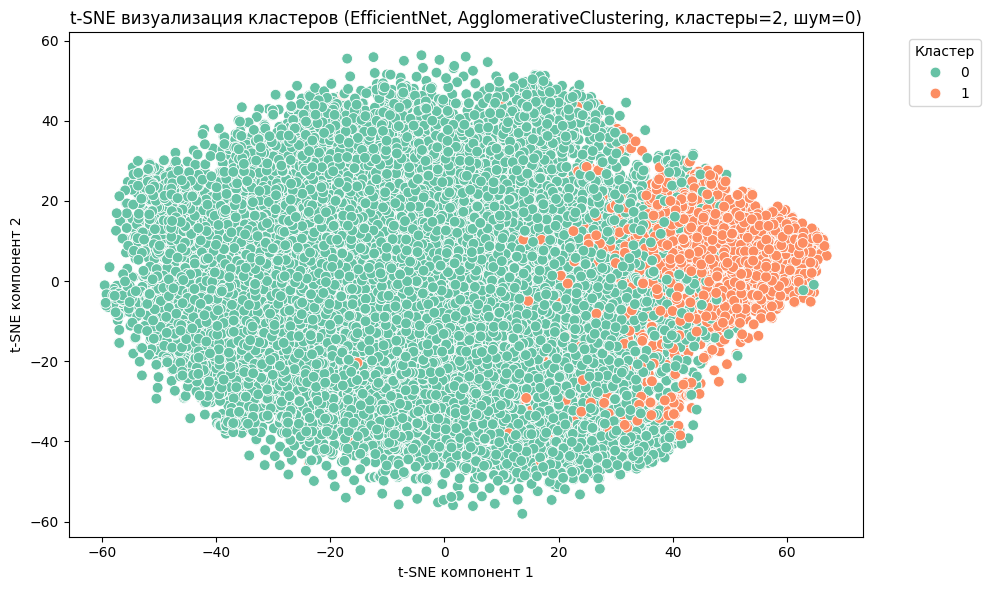

===> Добавлен столбец: cluster_AgglomerativeClustering
Кластеризация с SpectralClustering


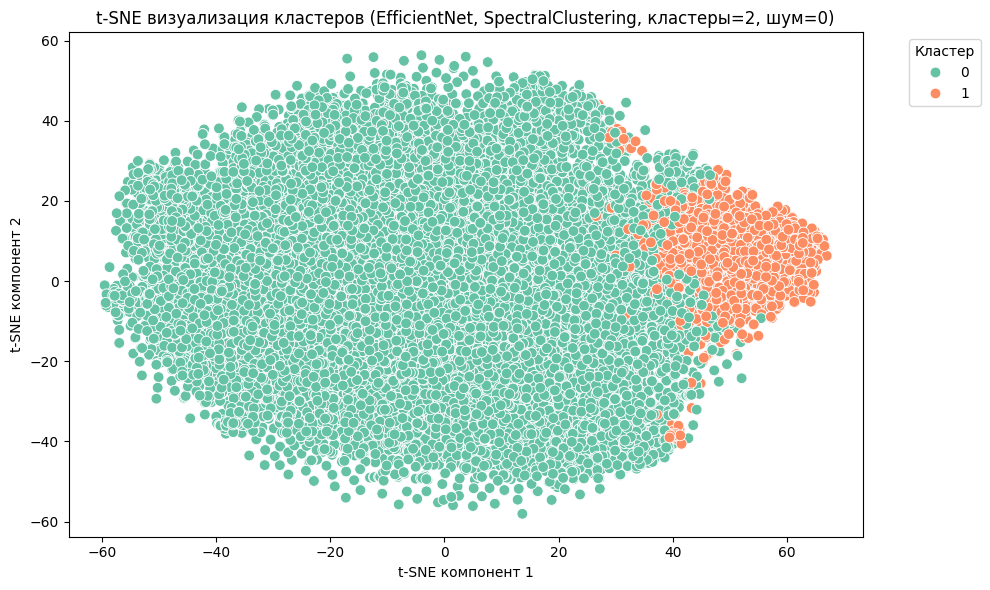

===> Добавлен столбец: cluster_SpectralClustering
===> Сохранено: Data/Clustered/efficientnet.pkl
===> Сохранён файл для EfficientNet в Data/Clustered/

Обработка дескриптора: OSNet
Используем колонку: pca_robust_scaled
Кластеризация с MiniBatchKMeans


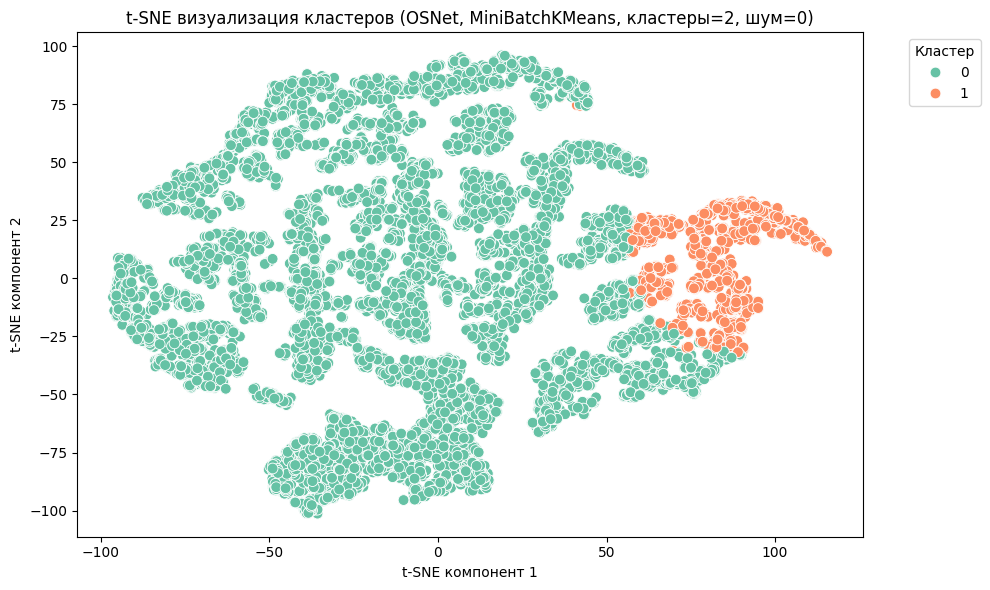

===> Добавлен столбец: cluster_MiniBatchKMeans
Кластеризация с GaussianMixture


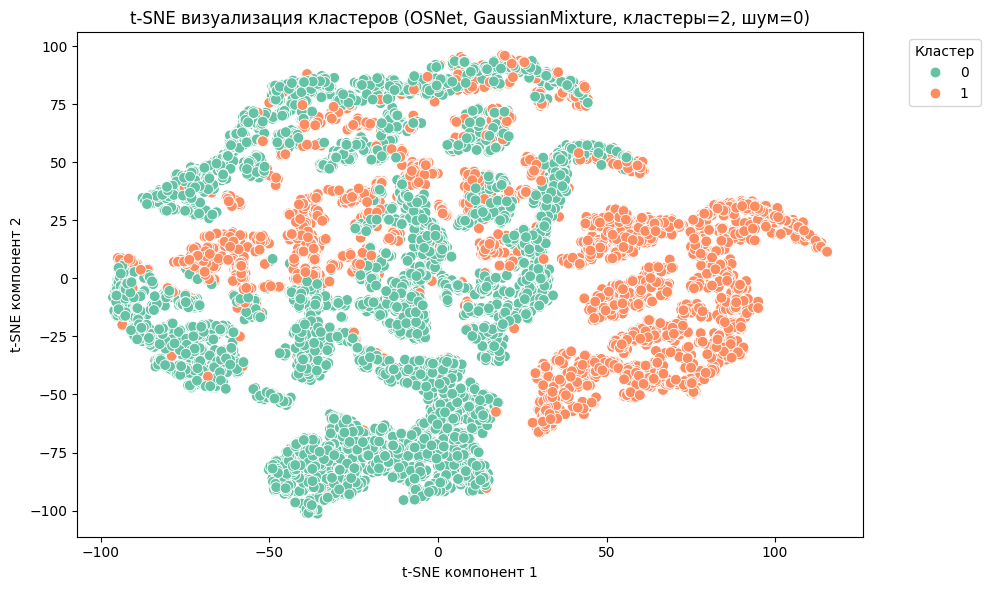

===> Добавлен столбец: cluster_GaussianMixture
Кластеризация с AgglomerativeClustering


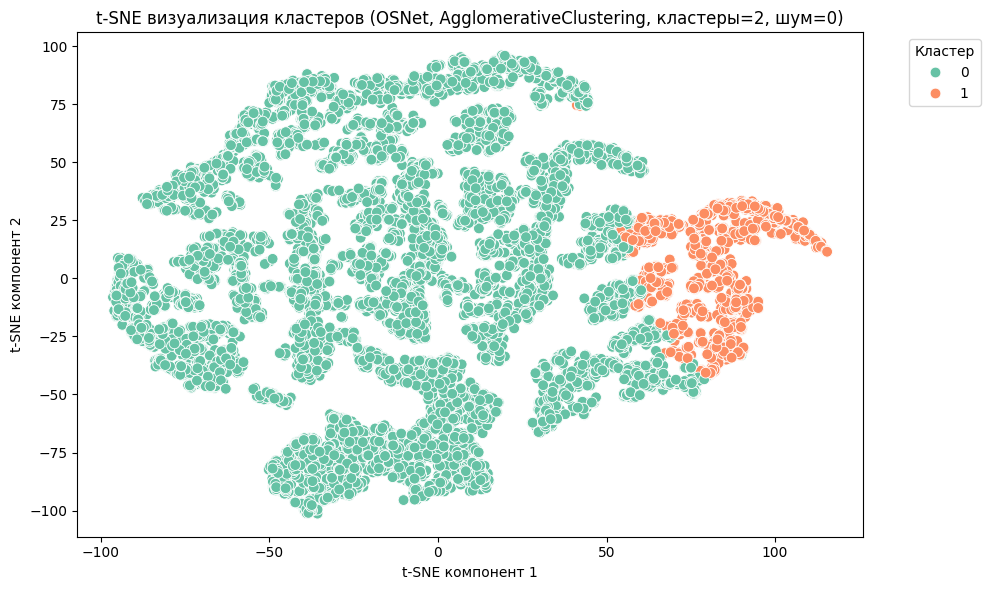

===> Добавлен столбец: cluster_AgglomerativeClustering
Кластеризация с SpectralClustering


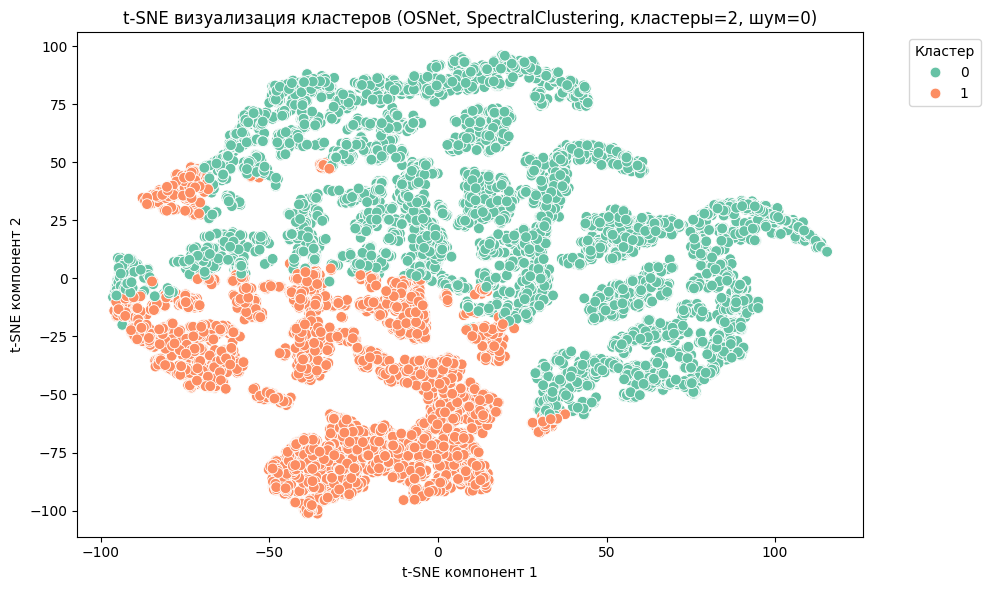

===> Добавлен столбец: cluster_SpectralClustering
===> Сохранено: Data/Clustered/osnet.pkl
===> Сохранён файл для OSNet в Data/Clustered/

Обработка дескриптора: VDC Type
Используем колонку: pca_robust_scaled
Кластеризация с MiniBatchKMeans


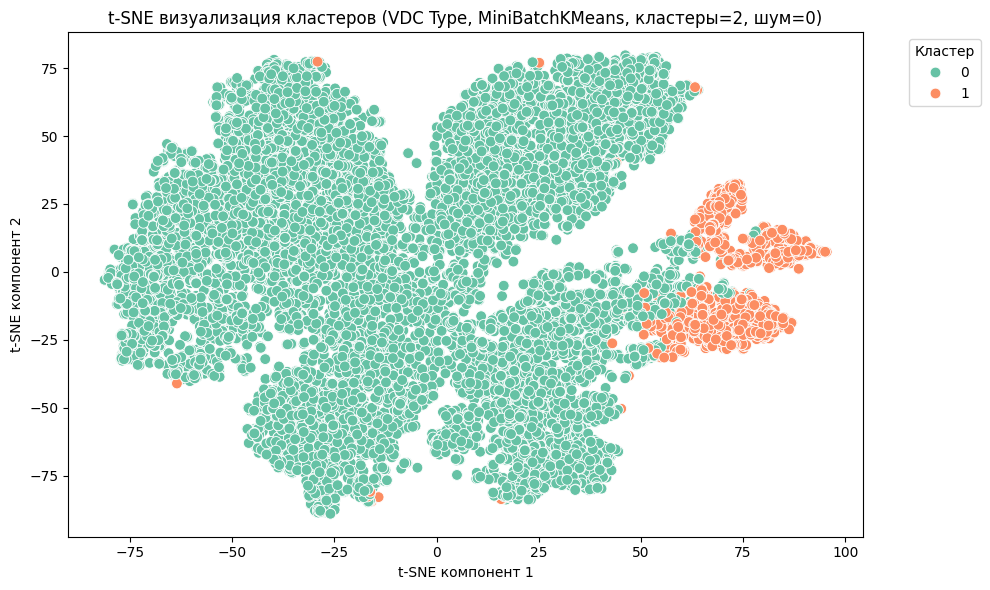

===> Добавлен столбец: cluster_MiniBatchKMeans
Кластеризация с GaussianMixture


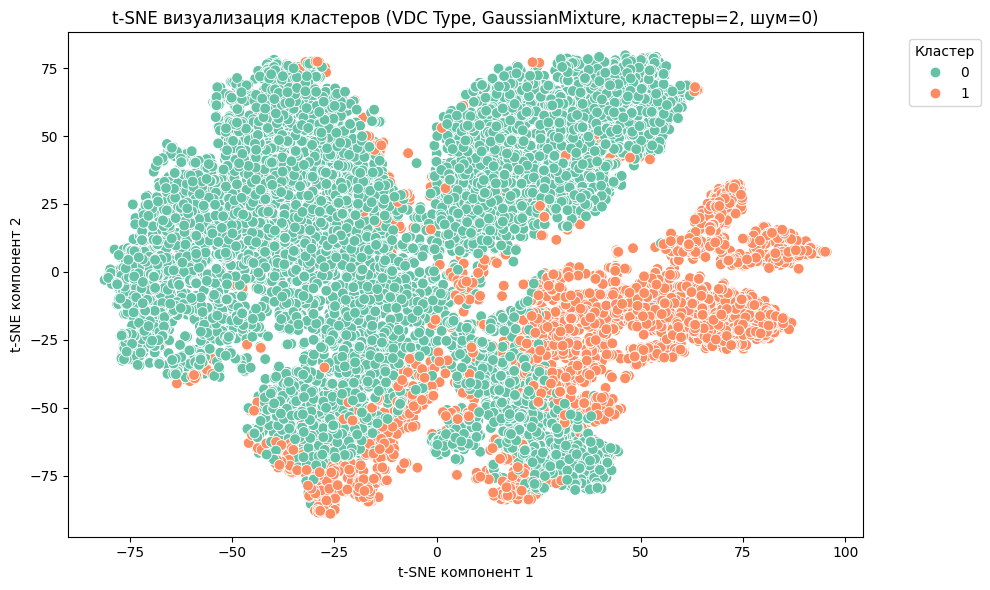

===> Добавлен столбец: cluster_GaussianMixture
Кластеризация с AgglomerativeClustering


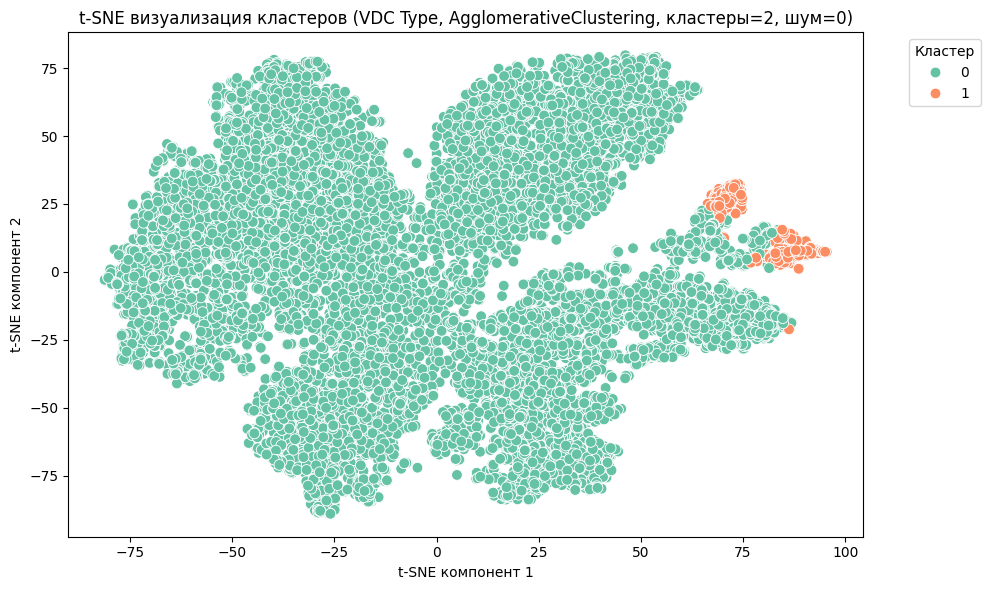

===> Добавлен столбец: cluster_AgglomerativeClustering
Кластеризация с SpectralClustering


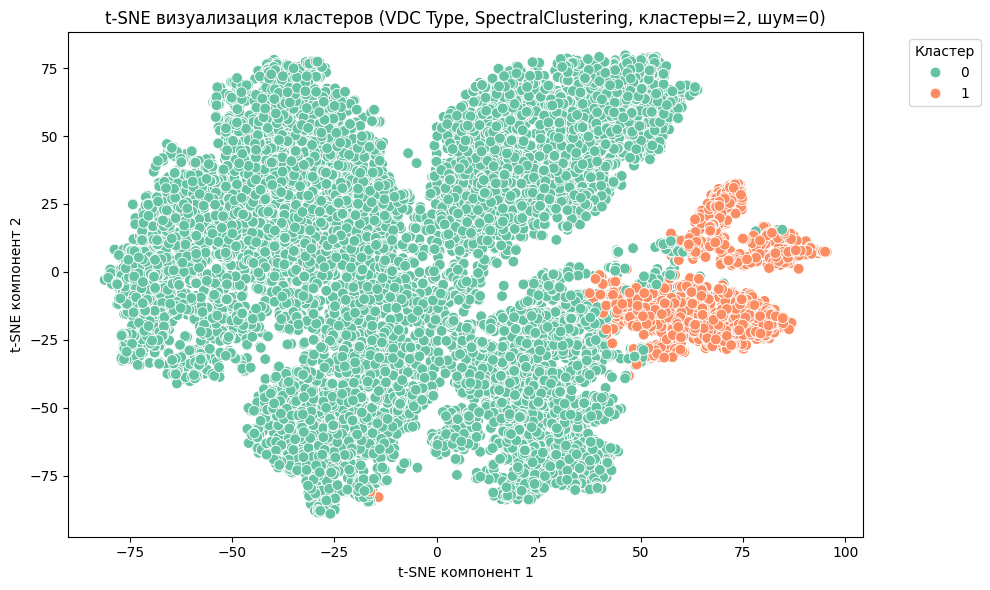

===> Добавлен столбец: cluster_SpectralClustering
===> Сохранено: Data/Clustered/vdc_type.pkl
===> Сохранён файл для VDC Type в Data/Clustered/

Обработка дескриптора: VDC Color
Используем колонку: pca_minmax_scaled
Кластеризация с MiniBatchKMeans


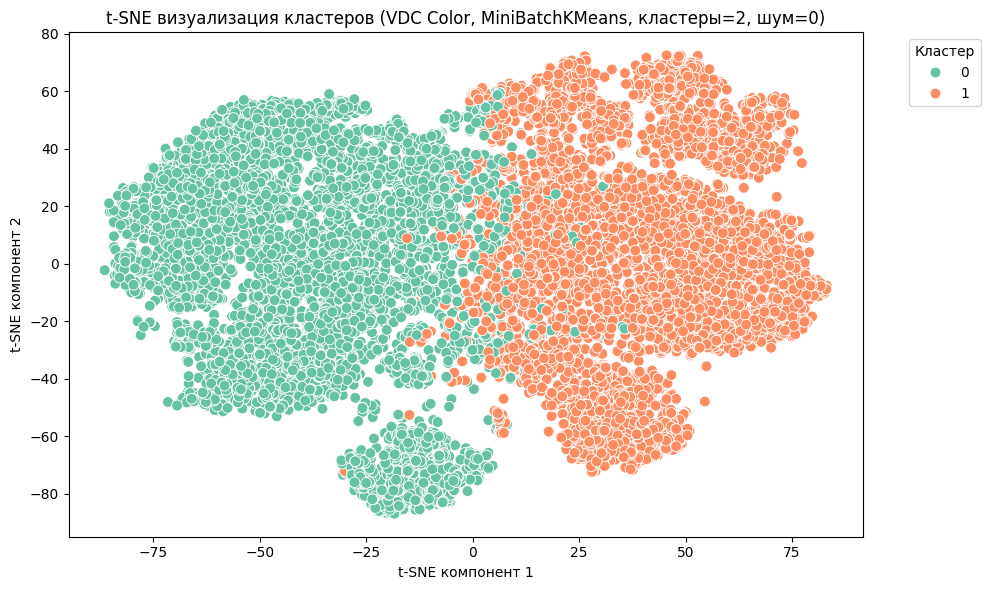

===> Добавлен столбец: cluster_MiniBatchKMeans
Кластеризация с GaussianMixture


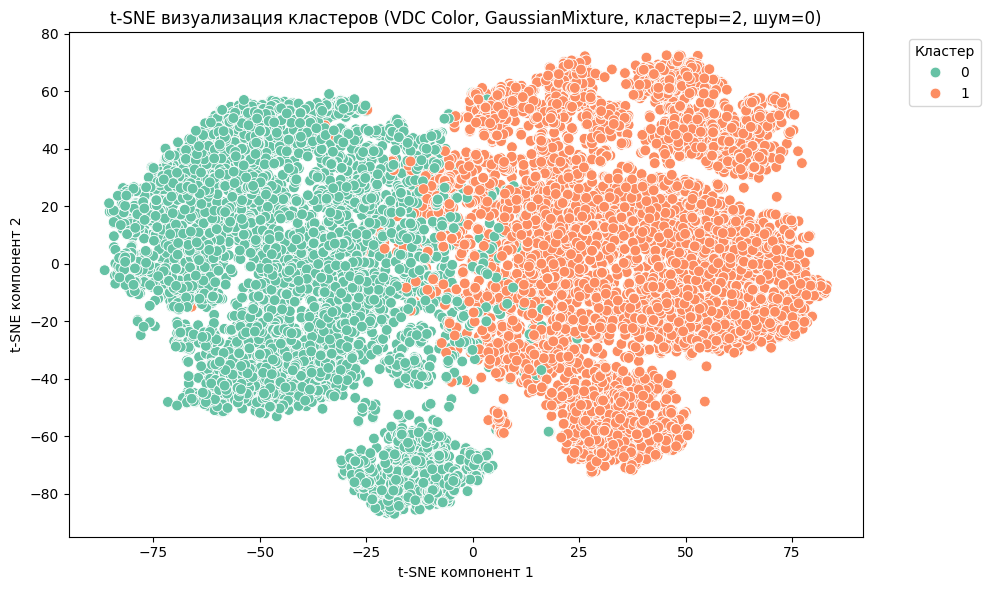

===> Добавлен столбец: cluster_GaussianMixture
Кластеризация с AgglomerativeClustering


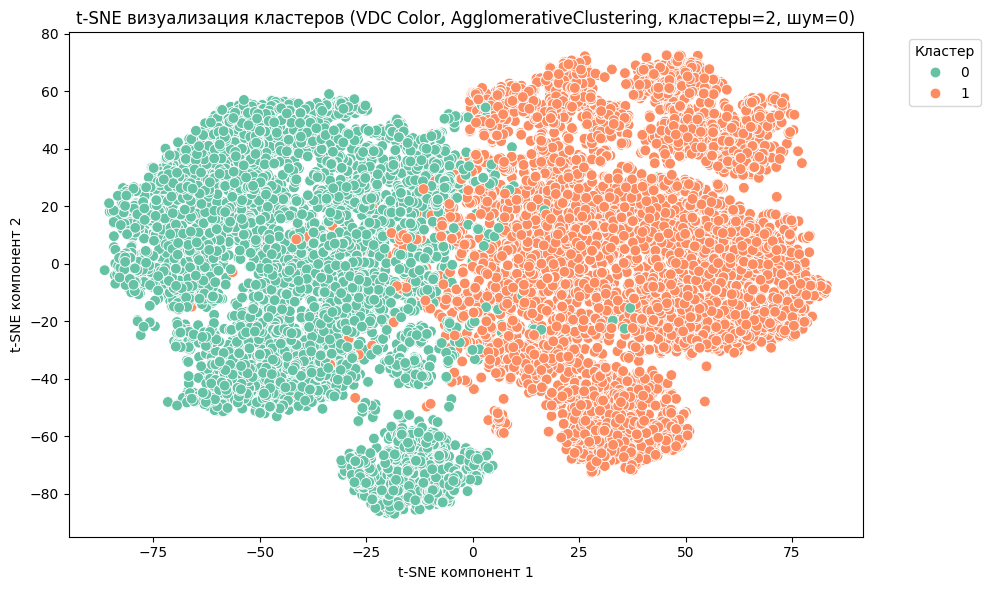

===> Добавлен столбец: cluster_AgglomerativeClustering
Кластеризация с SpectralClustering


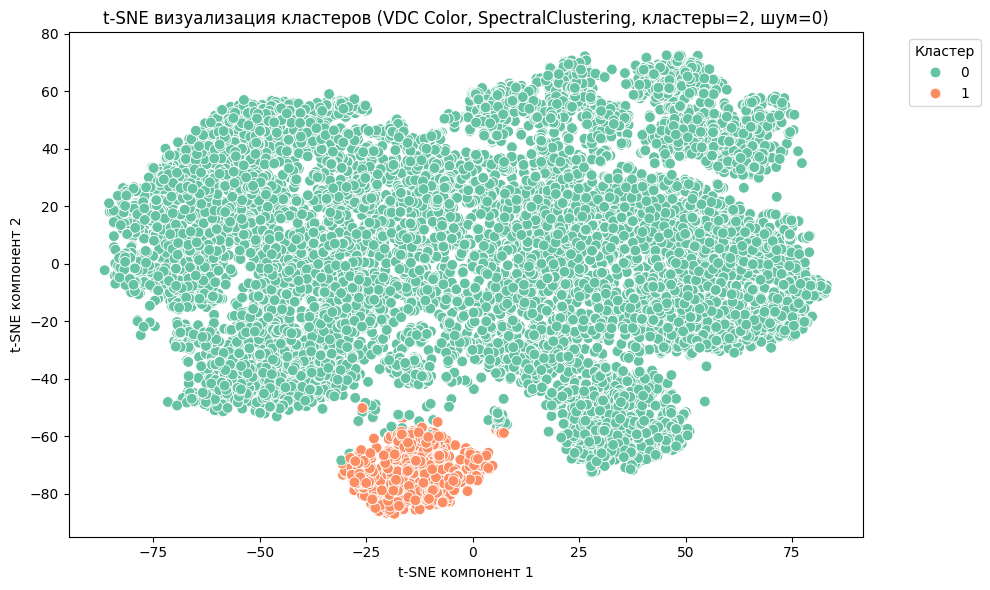

===> Добавлен столбец: cluster_SpectralClustering
===> Сохранено: Data/Clustered/vdc_color.pkl
===> Сохранён файл для VDC Color в Data/Clustered/


In [9]:
# Параметры
MAX_SAMPLES = 15_000
SAVE_FOLDER = 'Data/Clustered/'
os.makedirs(SAVE_FOLDER, exist_ok=True)

# Загружаем твои готовые DataFrame'ы
all_descriptors = {
    "EfficientNet": df_clast_efficientnet,
    "OSNet": df_clast_osnet,
    "VDC Type": df_clast_vdc_type,
    "VDC Color": df_clast_dc_color
}

# Количество кластеров по результатам оценки
best_k = {
    "EfficientNet": 2,
    "OSNet": 2,
    "VDC Color": 2,
    "VDC Type": 2,
}

# Кластерные модели
cluster_models = {
    "MiniBatchKMeans": lambda k: MiniBatchKMeans(n_clusters=k, random_state=42),
    "GaussianMixture": lambda k: GaussianMixture(n_components=k, random_state=42),
    "AgglomerativeClustering": lambda k: AgglomerativeClustering(n_clusters=k),
    "SpectralClustering": lambda k: SpectralClustering(n_clusters=k, 
                                                       affinity='nearest_neighbors', 
                                                       assign_labels='kmeans', 
                                                       random_state=42)
}

# Основной цикл
for name, df in all_descriptors.items():
    print(f"\nОбработка дескриптора: {name}")
    
    # Определяем колонку PCA
    pca_col = [col for col in df.columns if col.startswith('pca_')][0]
    print(f"Используем колонку: {pca_col}")
    
    # В np.array
    X_features = np.vstack(df[pca_col].values)
    
    # Срезаем
    X_subset = X_features[:MAX_SAMPLES]
    
    k = best_k.get(name, 2)
    
    # t-SNE
    tsne = TSNE(n_components=2, 
                random_state=42, 
                perplexity=30, 
                n_iter=1000)
    X_tsne = tsne.fit_transform(X_subset)
    
    # Цикл по моделям
    for model_name, model_func in cluster_models.items():
        print(f"Кластеризация с {model_name}")
        
        model = model_func(k)
        
        if hasattr(model, 'fit_predict'):
            labels = model.fit_predict(X_subset)
        else:
            model.fit(X_subset)
            labels = model.predict(X_subset)
        
        n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
        n_noise = list(labels).count(-1)
        
        # Визуализация
        plt.figure(figsize=(10, 6))
        sns.scatterplot(x=X_tsne[:, 0], y=X_tsne[:, 1], hue=labels, palette="Set2", s=60)
        plt.title(f"t-SNE визуализация кластеров ({name}, {model_name}, кластеры={n_clusters}, шум={n_noise})")
        plt.xlabel("t-SNE компонент 1")
        plt.ylabel("t-SNE компонент 2")
        plt.legend(title="Кластер", bbox_to_anchor=(1.05, 1), loc='upper left')
        plt.tight_layout()
        plt.show()
        
        # Добавляем метки кластеров в DataFrame
        cluster_col_name = f'cluster_{model_name}'
        df.loc[:MAX_SAMPLES-1, cluster_col_name] = labels
        print(f"===> Добавлен столбец: {cluster_col_name}")
    
    # Сохраняем готовый DataFrame с кластерами
    save_descriptors(df, desc_name=name, save_folder=SAVE_FOLDER)
    print(f"===> Сохранён файл для {name} в {SAVE_FOLDER}")

## Вывод:

На основе визуализаций и применения разных алгоритмов, при разъбиении всех дескрипторов на 2, можно сделать вывод, в целом, что все алгоритмы, не плохо справились с задачей, однако стоит выделить из этого списка два алгоритма: 
1. __SpectralClustering__ 
2. __MiniBatchKMeans__ 

Между визуализациями обоих алгоритмов, часто наблюдаются различия в интерпретациях границ кластеров, что вполне нормально.

Вместо резюме:

* __MiniBatchKMeans__ подходит для быстрого, масштабируемого (на больших данных) и грубой оценки структуры данных;
* __SpectralClustering__ даёт более детальную и гибкую кластеризацию, способен выявлять сложные, нелинейные структуры, подойдет для исследования данных.

In [11]:
# Загружаем сохраненные ранее файлы
df_efficientnet = load_descriptors('Data/Clustered/efficientnet.pkl')
df_osnet = load_descriptors('Data/Clustered/osnet.pkl')
df_vdc_color = load_descriptors('Data/Clustered/vdc_color.pkl')
df_vdc_type = load_descriptors('Data/Clustered/vdc_type.pkl')

In [12]:
display(df_efficientnet.head(2))
display(df_osnet.head(2))
display(df_vdc_color.head(2))
display(df_vdc_type.head(2))

,image_path,pca_robust_scaled,cluster_MiniBatchKMeans,cluster_GaussianMixture,cluster_AgglomerativeClustering,cluster_SpectralClustering
0,veriwild\1\00001\000001.jpg,"[-4.8200326, 6.185469, -3.7890584, 4.79172, -0...",1.0,0.0,0.0,0.0
1,veriwild\1\00001\000002.jpg,"[0.07121316, 5.1648097, -6.2292476, 2.5668344,...",1.0,0.0,0.0,0.0


,image_path,pca_robust_scaled,cluster_MiniBatchKMeans,cluster_GaussianMixture,cluster_AgglomerativeClustering,cluster_SpectralClustering
0,veriwild\1\00001\000001.jpg,"[-47.03444, 46.07119, -18.381063, -9.60357, -4...",0.0,0.0,0.0,0.0
1,veriwild\1\00001\000002.jpg,"[-57.52702, 260.12463, -17.010658, -7.9755044,...",0.0,0.0,0.0,0.0


,image_path,pca_minmax_scaled,cluster_MiniBatchKMeans,cluster_GaussianMixture,cluster_AgglomerativeClustering,cluster_SpectralClustering
0,veriwild\1\00001\000001.jpg,"[0.7752067, 0.12029028, 0.027938724, -0.108644...",1.0,1.0,1.0,0.0
1,veriwild\1\00001\000002.jpg,"[1.0860487, -0.43857765, -0.13115835, -0.22322...",1.0,1.0,1.0,0.0


,image_path,pca_robust_scaled,cluster_MiniBatchKMeans,cluster_GaussianMixture,cluster_AgglomerativeClustering,cluster_SpectralClustering
0,veriwild\1\00001\000001.jpg,"[-5.318824, -11.911387, 7.9186993, -9.072136, ...",0.0,0.0,0.0,0.0
1,veriwild\1\00001\000002.jpg,"[-7.4111724, -7.241379, 5.5474443, -4.3209524,...",0.0,0.0,0.0,0.0


#### 3.2.2. Визуализация изображений в кластере


Визуализируем несколько изображений из каждого кластера, чтобы проинтерпретировать результаты.

**Как визуализировать изображения, соответствующие определённому кластеру?**

Мы не рассматривали работу с изображениями как отдельную тему, однако не волнуемся — в этом нет ничего страшного.

В стандартных библиотеках для визуализации, которые изучали ранее, есть встроенный функционал для чтения и визуализации изображений. Например, в библиотеке matplotlib есть функция `plt.imread()`, которая позволяет читать изображение по переданному пути. Она возвращает numpy-массив размерности (h, w, c), где:

* h — высота изображения,  
* w — его ширина,  
* c — количество каналов.

Так как все изображения в нашем датасете цветные, каналов (c) три:

* R — матрица интенсивности пикселей красного цвета,  
* G — матрица интенсивности пикселей зелёного цвета,  
* B — матрица интенсивности пикселей синего цвета.

Например, вот так можно прочитать изображение 000001.jpg:

```python
img = plt.imread('raw_data/veriwild/1/00001/000001.jpg')
print(img.shape)
## (557, 756, 3)
```

То есть изображение состоит из трёх матриц (R, G и B) с размерностью 557 строк на 756 столбцов. Элементами каждой из матриц являются интенсивности пикселей (от 0 до 255) соответствующего цвета.

Что касается вывода изображений на экран, в библиотеке matplotlib есть встроенная функция plt.imshow(), которая позволяет вывести переданное ей изображение:

```python
fig = plt.figure(figsize=(5, 5))
plt.imshow(img);
```

Функцию `imshow()` можно вызывать и от имени координатных плоскостей при использовании `subplots` из библиотеки `matplotlib`:

```python
img1 = plt.imread('raw_data/veriwild/1/00001/000001.jpg')
img2 = plt.imread('raw_data/veriwild/1/00001/000002.jpg')
fig, axes = plt.subplots(1, 2, figsize=(5, 5))
axes[0].imshow(img1);
axes[1].imshow(img2);
```

После кластеризации для интерпретации результатов визуализируем несколько изображений из каждого кластера с помощью подготовленной функции `plot_sample_cluster_images()`.

Например, произведём кластеризацию и запишем пути до изображений в виде столбца `"paths"` и метки кластеров в виде столбца `"cluster"` в некоторый DataFrame с именем `data`. Тогда, чтобы визуализировать несколько случайных изображений из кластера 0, вызовем функцию `plot_sample_cluster_images()` следующим образом:

```python
    plot_samples_images(data=data, cluster_label=0)
```


=== Визуализация: efficientnet | cluster_MiniBatchKMeans | cluster #1 ===


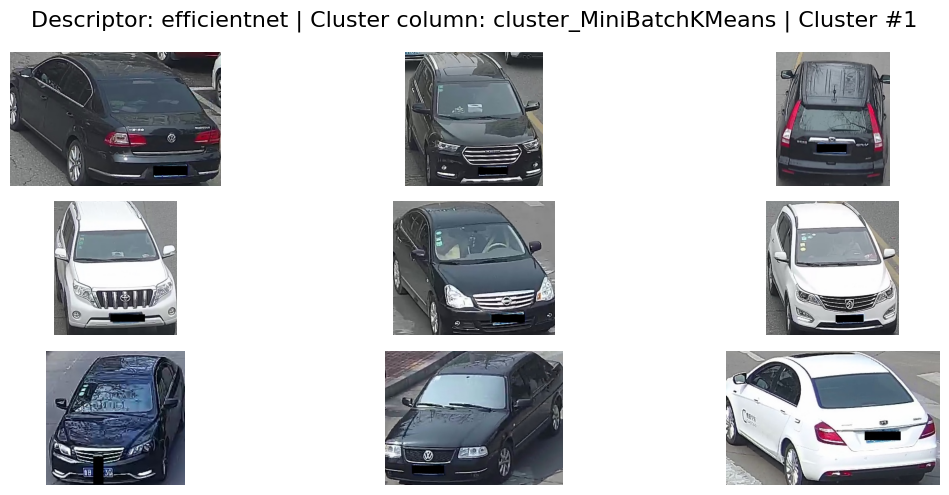


=== Визуализация: efficientnet | cluster_SpectralClustering | cluster #1 ===


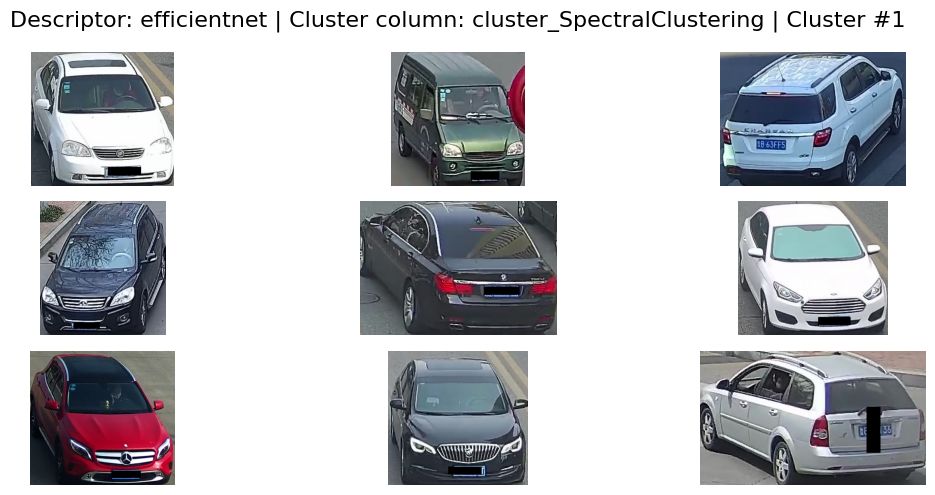


=== Визуализация: osnet | cluster_MiniBatchKMeans | cluster #1 ===


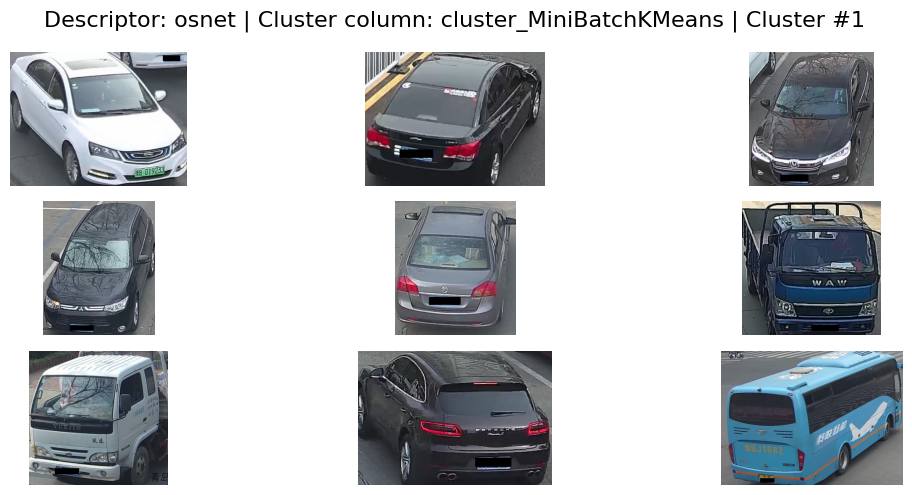


=== Визуализация: osnet | cluster_SpectralClustering | cluster #1 ===


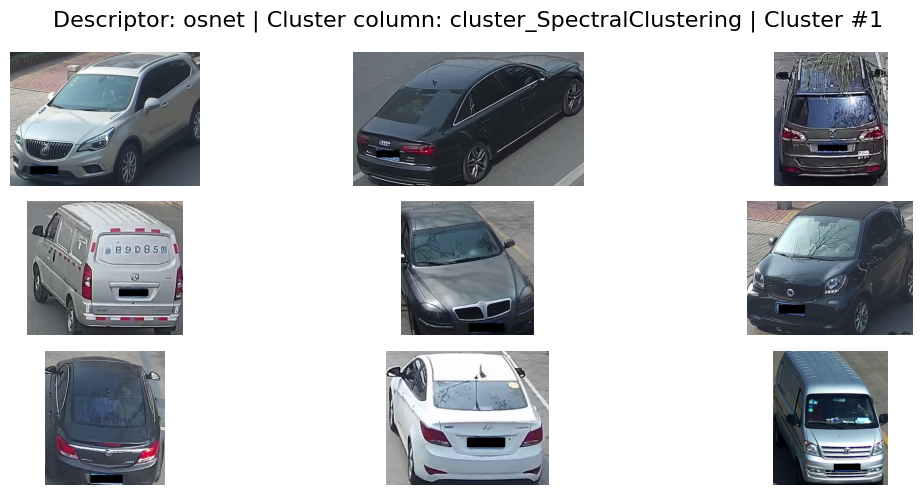


=== Визуализация: vdc_type | cluster_MiniBatchKMeans | cluster #1 ===


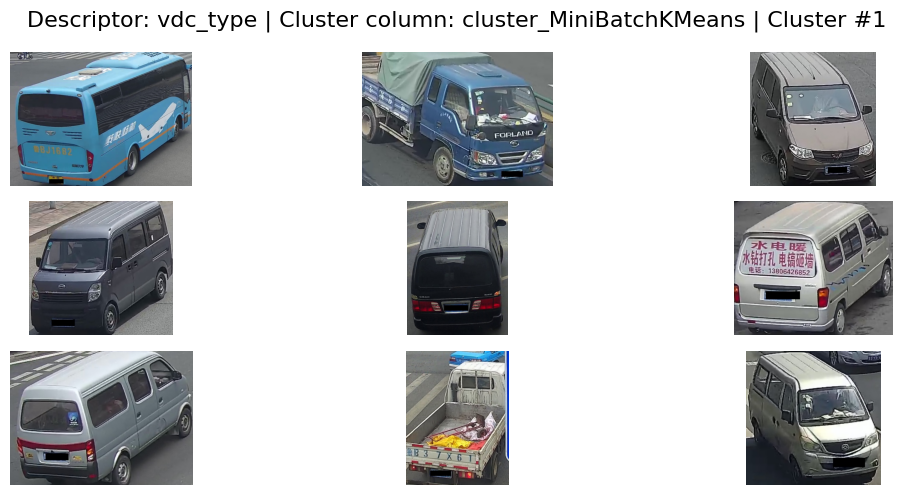


=== Визуализация: vdc_type | cluster_SpectralClustering | cluster #1 ===


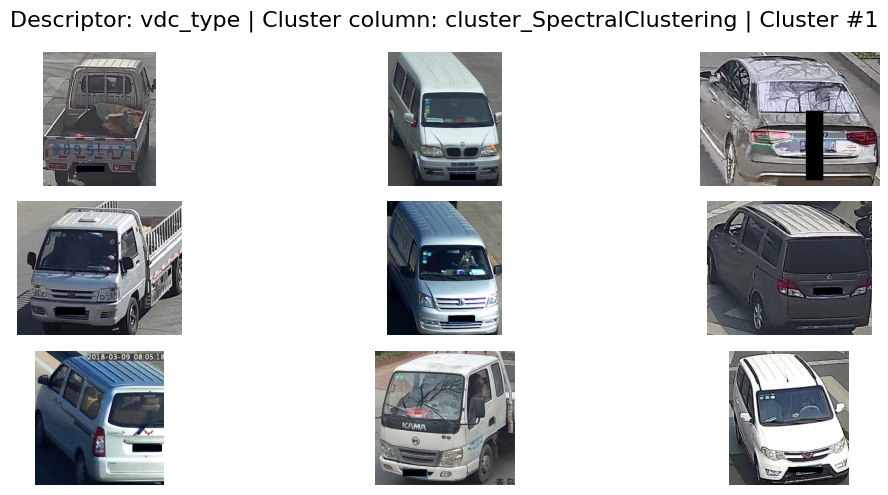


=== Визуализация: vdc_color | cluster_MiniBatchKMeans | cluster #1 ===


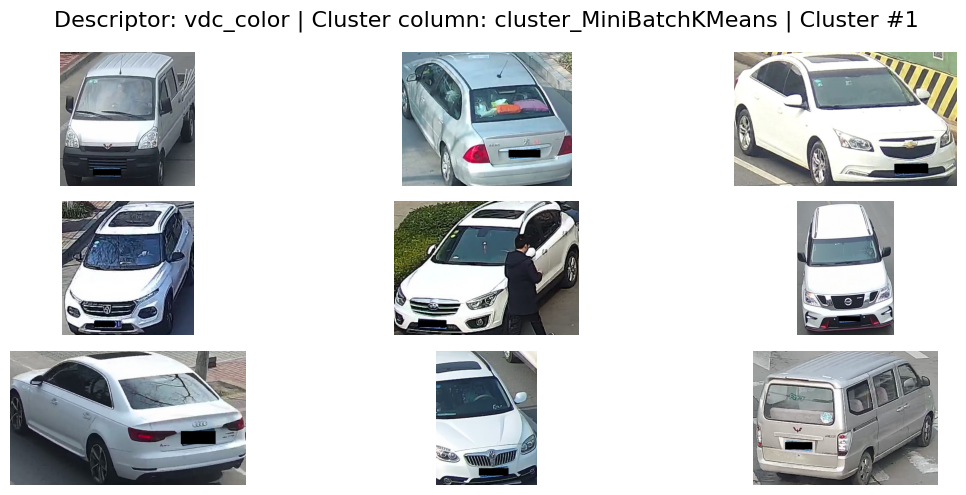


=== Визуализация: vdc_color | cluster_SpectralClustering | cluster #1 ===


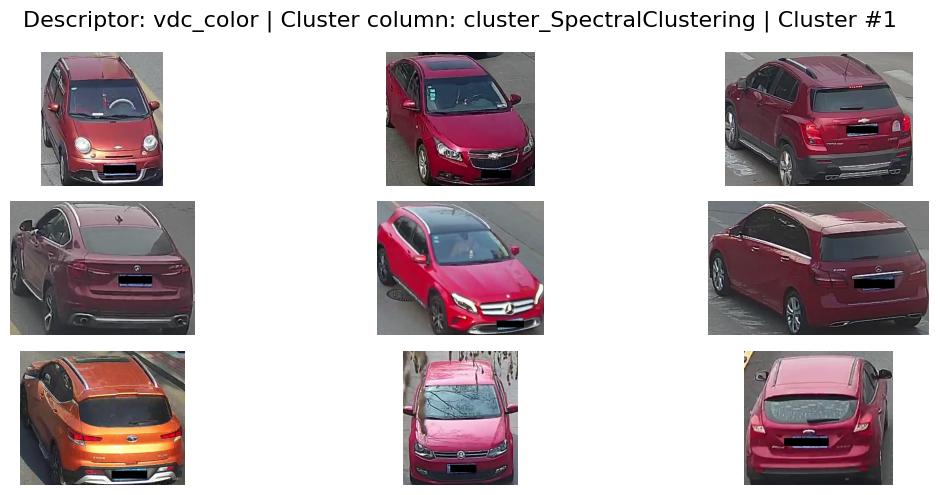

In [13]:
# Словарь дескриптор -> DataFrame
all_dfs = {
    "efficientnet": df_efficientnet,
    "osnet": df_osnet,
    "vdc_type": df_vdc_type,
    "vdc_color": df_vdc_color
}

# Список кластеризаций, которые ты хочешь визуализировать
cluster_cols = [
    'cluster_MiniBatchKMeans',
    'cluster_SpectralClustering'
]

# Для какого кластера будем строить картинки
target_cluster_label = 1

# Цикл по всем комбинациям
for descriptor_name, df in all_dfs.items():
    for cluster_col in cluster_cols:
        print(f"\n=== Визуализация: {descriptor_name} | {cluster_col} | cluster #{target_cluster_label} ===")
        
        plot_samples_images(
            data=df,
            cluster_col=cluster_col,
            cluster_label=target_cluster_label,
            base_dir="Data/raw_data",
            descriptor_name=descriptor_name
        )

# Вывод:

В результате кластеризации по четырём дескрипторам (EfficientNet, OSNet, VDC_Type, VDC_Color) были получены интерпретируемые группы автомобилей.

Для каждого дескриптора использовались два алгоритма: MiniBatchKMeans и SpectralClustering. Визуальный анализ выделенных кластеров показывает:

- EfficientNet и OSNet формируют группы по визуальной похожести (форма, ракурс, цвет), возможны единичные выбросы.

- VDC_Type выделяет кластеры по форм-фактору (седан, внедорожник, автобус и т.п.).

- VDC_Color надёжно группирует автомобили по цвету кузова.

Изображения в кластерах в целом качественные и соответствуют ожидаемым признакам. Структура кластеров подтверждает валидность дескрипторов и алгоритмов. Визуальный анализ помогает дополнительно интерпретировать их вклад в группировку данных.

### 3.3. Поиск выбросов

С помощью известных нам методов поиска выбросов (например, DBSCAN) попытаемся найти выбросы среди изображений, используя все варианты дескрипторов. Подберём параметры алгоритма.

Визуализируем изображения, попавшие в раздел выбросов, и попробуем проинтерпретировать полученные результаты. Подумаем, почему именно эти изображения попали в выбросы.

Сравним результаты для всех вариантов дескрипторов. Определим, какой вариант дескрипторов даёт наилучшее представление о выбросах.


=== HDBSCAN для efficientnet ===
Найдено кластеров: 0
Найдено выбросов: 15000
Выводим выбросы для efficientnet


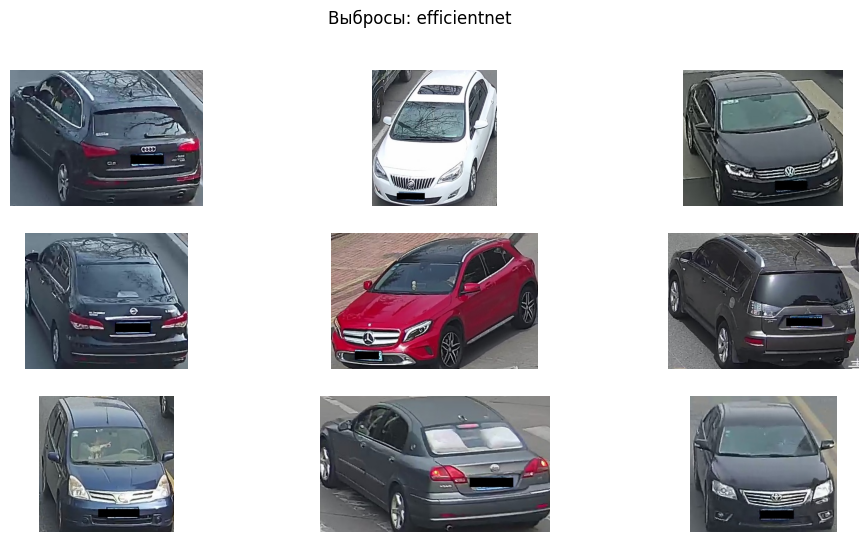


=== HDBSCAN для osnet ===
Найдено кластеров: 17
Найдено выбросов: 11520
Выводим выбросы для osnet


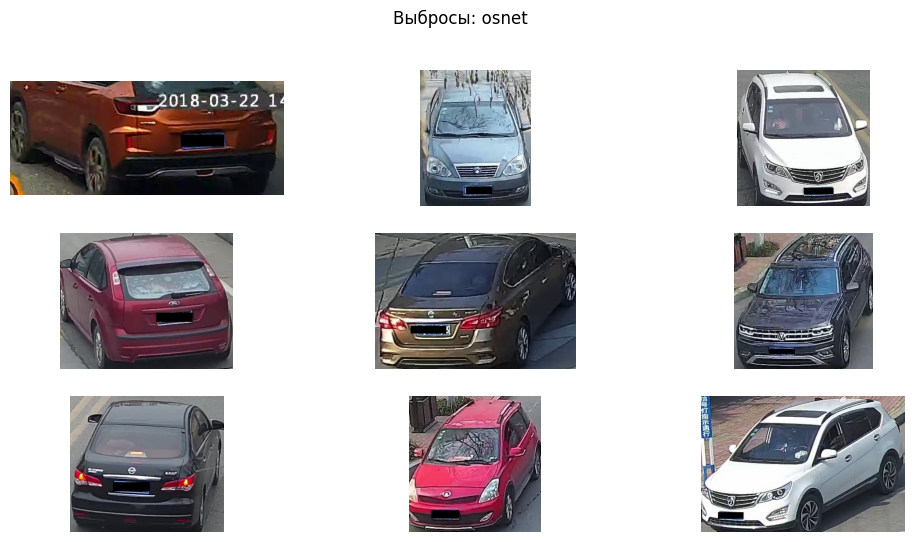


=== HDBSCAN для vdc_type ===
Найдено кластеров: 2
Найдено выбросов: 14172
Выводим выбросы для vdc_type


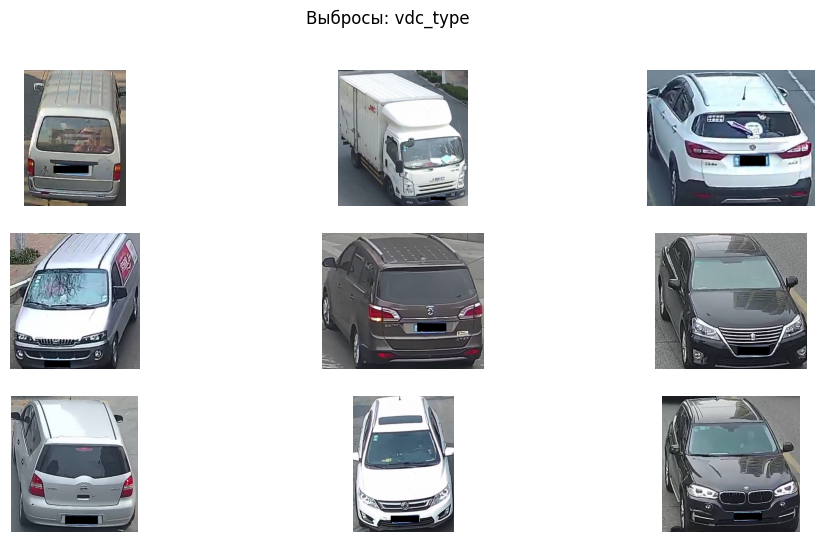


=== HDBSCAN для vdc_color ===
Найдено кластеров: 2
Найдено выбросов: 5469
Выводим выбросы для vdc_color


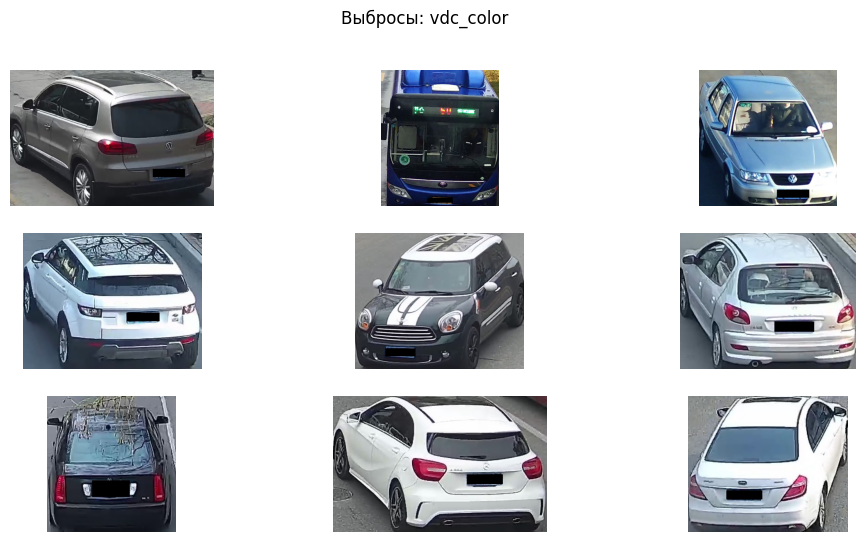

In [14]:
MAX_SAMPLES = 15_000

all_descriptors = {
    "efficientnet": df_efficientnet,
    "osnet": df_osnet,
    "vdc_type": df_vdc_type,
    "vdc_color": df_vdc_color
}

for name, df in all_descriptors.items():
    print(f"\n=== HDBSCAN для {name} ===")
    
    # Берём PCA
    pca_col = [c for c in df.columns if c.startswith('pca_')][0]
    X = np.vstack(df[pca_col].values)[:MAX_SAMPLES]

    # Обучаем HDBSCAN
    hdb = HDBSCAN(min_cluster_size=50, min_samples=5)
    labels = hdb.fit_predict(X)

    # Сохраняем в DataFrame
    df.loc[:, 'cluster_HDBSCAN'] = np.nan
    df.loc[:MAX_SAMPLES-1, 'cluster_HDBSCAN'] = labels

    # Статистика
    n_outliers = list(labels).count(-1)
    n_clusters = len(set(labels)) - (1 if -1 in labels else 0)

    print(f"Найдено кластеров: {n_clusters}")
    print(f"Найдено выбросов: {n_outliers}")

    # Визуализация
    plot_outliers(df, "Data/raw_data", name, cluster_col='cluster_HDBSCAN')

## Вывод: 

Применение HDBSCAN показало, что не все типы дескрипторов одинаково пригодны для кластеризации:

* EfficientNet в текущем виде — не кластеризуемый.

* OSNet и VDC Color — имеют кластерную структуру, пригодны для применения HDBSCAN.

* VDC Type — требует дополнительной настройки параметров.

Высокая доля выбросов в OSNet и VDC Type говорит о наличии сложной структуры и/или высокой внутрикластерной вариабельности.

Использование PCA c ограничением по компонентам (до 100) в целом позволило снизить размерность, но для некоторых дескрипторов (EfficientNet) возможно недостаточно хорошо сохранило структуру.

In [15]:
FINAL_SAVE_FOLDER = 'Data/Final/'
os.makedirs(FINAL_SAVE_FOLDER, exist_ok=True)

all_descriptors = {
    "efficientnet": df_efficientnet,
    "osnet": df_osnet,
    "vdc_type": df_vdc_type,
    "vdc_color": df_vdc_color
}

best_k = {
    "efficientnet": 2,
    "osnet": 2,
    "vdc_color": 2,
    "vdc_type": 2,
}

for name, df in all_descriptors.items():
    print(f"\nОбработка дескриптора: {name}")
    
    # Колонка с PCA-признаками
    pca_col = [col for col in df.columns if col.startswith('pca_')][0]
    print(f"Используем колонку с признаками: {pca_col}")

    # Конвертация в numpy-массив (все данные)
    X_features = np.vstack(df[pca_col].values)
    k = best_k.get(name, 2)
    
    # Кластеризация MiniBatchKMeans
    print("Кластеризация с MiniBatchKMeans")
    model = MiniBatchKMeans(n_clusters=k, random_state=42)
    labels = model.fit_predict(X_features)
    
    # Добавляем метки кластеров в DataFrame
    cluster_col_name = 'cluster'
    df[cluster_col_name] = labels
    print(f"Добавлен столбец с кластерами: {cluster_col_name}")
    
    # --- Сохраняем финальный CSV только с колонками image_path и cluster ---
    df_final = df[['image_path', cluster_col_name]].copy()
    df_final = df_final.rename(columns={cluster_col_name: 'cluster'})
    
    csv_path = os.path.join(FINAL_SAVE_FOLDER, f'df_final_{name}.csv')
    df_final.to_csv(csv_path, index=False)
    print(f'Финальный CSV сохранён: {csv_path}')


Обработка дескриптора: efficientnet
Используем колонку с признаками: pca_robust_scaled
Кластеризация с MiniBatchKMeans
Добавлен столбец с кластерами: cluster
Финальный CSV сохранён: Data/Final/df_final_efficientnet.csv

Обработка дескриптора: osnet
Используем колонку с признаками: pca_robust_scaled
Кластеризация с MiniBatchKMeans
Добавлен столбец с кластерами: cluster
Финальный CSV сохранён: Data/Final/df_final_osnet.csv

Обработка дескриптора: vdc_type
Используем колонку с признаками: pca_robust_scaled
Кластеризация с MiniBatchKMeans
Добавлен столбец с кластерами: cluster
Финальный CSV сохранён: Data/Final/df_final_vdc_type.csv

Обработка дескриптора: vdc_color
Используем колонку с признаками: pca_minmax_scaled
Кластеризация с MiniBatchKMeans
Добавлен столбец с кластерами: cluster
Финальный CSV сохранён: Data/Final/df_final_vdc_color.csv


## 4. Выводы и оформление проекта

На основе результатов, полученных при выполнении проекта, сделаем вывод по задаче, приведя таблицу со сравнением результатов кластеризации на каждом из наборов дескрипторов. Приведём сравнение вариантов предобработки исходных данных по качеству кластеризации.

Результатом нашей работы станет небольшое исследование, в котором дадим команде IntelliVision рекомендации, какие дескрипторы, с какой предобработкой и каким алгоритмом кластеризации лучше всего подходят для решения задачи.

Также сохраним результаты лучшего алгоритма в CSV-файл со столбцами `path` (путь до изображения) и `cluster` (номер кластера). В описании к проекту приведём расшифровку каждого из кластеров.

Когда закончим выполнять проект, создадим в своём репозитории файл `README.md` и кратко опишем содержание проекта по принципу, который приводили ранее.

In [16]:
# Загружаем сохраненные ранее файлы
df_efficientnet = pd.read_csv('Data/Final/df_final_efficientnet.csv')
df_osnet = pd.read_csv('Data/Final/df_final_osnet.csv')
df_vdc_color = pd.read_csv('Data/Final/df_final_vdc_color.csv')
df_vdc_type = pd.read_csv('Data/Final/df_final_vdc_type.csv')

dataset_overview(df_efficientnet, 'df_final_efficientnet')
dataset_overview(df_osnet, 'df_final_osnet')
dataset_overview(df_vdc_color, 'df_final_vdc_color')
dataset_overview(df_vdc_type, 'df_final_vdc_type')


--- Обзор: df_final_efficientnet ---
Размер (строк, столбцов): (416314, 2)

Информация о типах данных:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 416314 entries, 0 to 416313
Data columns (total 2 columns):
 #   Column      Non-Null Count   Dtype 
---  ------      --------------   ----- 
 0   image_path  416314 non-null  object
 1   cluster     416314 non-null  int64 
dtypes: int64(1), object(1)
memory usage: 6.4+ MB
None

Статистика по числовым столбцам:
             cluster
count  416314.000000
mean        0.798260
std         0.401299
min         0.000000
25%         1.000000
50%         1.000000
75%         1.000000
max         1.000000

Количество пропущенных значений по столбцам:
image_path    0
cluster       0
dtype: int64

Количество дублирующихся строк: 0
----------------------------------------

--- Обзор: df_final_osnet ---
Размер (строк, столбцов): (416314, 2)

Информация о типах данных:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 416314 entries, 0 to 416313
Da

In [17]:
# Данные cобранные в ходе исследования
data = [
    ["EfficientNet", "RobustScaler", "MiniBatchKMeans", 2, 0.1471, 1908.5922, 2.6252, "[X]"],
    ["EfficientNet", "RobustScaler", "SpectralClustering", 2, 0.1468, 1900.4907, 2.6277, "[X]"],

    ["OSNet", "RobustScaler", "MiniBatchKMeans", 2, 0.6758, 13628.8203, 0.6466, "[V]"],
    ["OSNet", "RobustScaler", "SpectralClustering", 2, 0.0906, 1584.0736, 2.8681, "[V]"],

    ["VDC_Type", "RobustScaler", "MiniBatchKMeans", 2, 0.5224, 4253.5977, 1.2171, "[!]"],
    ["VDC_Type", "RobustScaler", "SpectralClustering", 2, 0.2522, 5469.7686, 1.5109, "[!]"],

    ["VDC_Color", "MinMaxScaler", "MiniBatchKMeans", 2, 0.2395, 5366.5181, 1.6087, "[V]"],
    ["VDC_Color", "MinMaxScaler", "SpectralClustering", 3, 0.1957, 3484.0959, 1.7014, "[V]"]
]

columns = [
    "Дескриптор", "Предобработка", "Алгоритм",
    "Число кластеров (k)", "Silhouette Score",
    "Calinski-Harabasz Score", "Davies-Bouldin Score",
    "Применимость HDBSCAN"
]

df_results = pd.DataFrame(data, columns=columns)

pd.set_option('display.precision', 4)
display(df_results)

,Дескриптор,Предобработка,Алгоритм,Число кластеров (k),Silhouette Score,Calinski-Harabasz Score,Davies-Bouldin Score,Применимость HDBSCAN
0,EfficientNet,RobustScaler,MiniBatchKMeans,2,0.1471,1908.5922,2.6252,[X]
1,EfficientNet,RobustScaler,SpectralClustering,2,0.1468,1900.4907,2.6277,[X]
2,OSNet,RobustScaler,MiniBatchKMeans,2,0.6758,13628.8203,0.6466,[V]
3,OSNet,RobustScaler,SpectralClustering,2,0.0906,1584.0736,2.8681,[V]
4,VDC_Type,RobustScaler,MiniBatchKMeans,2,0.5224,4253.5977,1.2171,[!]
5,VDC_Type,RobustScaler,SpectralClustering,2,0.2522,5469.7686,1.5109,[!]
6,VDC_Color,MinMaxScaler,MiniBatchKMeans,2,0.2395,5366.5181,1.6087,[V]
7,VDC_Color,MinMaxScaler,SpectralClustering,3,0.1957,3484.0959,1.7014,[V]


# Заключительный вывод:

В ходе проекта были проведены эксперименты по кластеризации изображений автомобилей с использованием различных дескрипторов, вариантов предобработки и алгоритмов кластеризации. Ниже приведено обобщённое сравнение результатов и рекомендации для команды IntelliVision.

### Сравнение вариантов предобработки
- Robust Scaler оказался наиболее универсальным вариантом для EfficientNet, OSNet и VDC_Type, позволяющим добиться стабильной кластеризации.

- Для VDC_Color оптимальной оказалась предобработка MinMaxScaler, так как она хорошо сохраняет цветовые различия.

### Итоги по алгоритмам
- MiniBatchKMeans — рекомендуется как базовый, быстрый и масштабируемый алгоритм для всех дескрипторов. Подходит для производственного конвейера.

- SpectralClustering — полезен для более детальной, исследовательской кластеризации, особенно для сложных случаев (OSNet, VDC_Type), но менее масштабируем.

### Выводы по дескрипторам
- EfficientNet в текущем виде (после PCA) не даёт хорошей кластерной структуры, требует дополнительной настройки или альтернативной редукции размерности.

- OSNet даёт чёткие, хорошо интерпретируемые кластеры по общей визуальной похожести. Рекомендуется для использования.

- VDC_Type хорошо отражает форм-фактор автомобилей. Пригоден для задач, где важно различать типы ТС.

- VDC_Color отлично группирует автомобили по цвету кузова, особенно полезен в качестве первого фильтра.

Таким образом, оптимальный стек для кластеризации изображений автомобилей — комбинация дескрипторов OSNet, VDC_Type и VDC_Color с их соответствующими вариантами предобработки и использованием MiniBatchKMeans как основного алгоритма.

### Возможность комбинирования дескрипторов
В перспективе можно объединить несколько дескрипторов для более комплексной кластеризации изображений автомобилей. Базовый подход — простая конкатенация признаков различных типов (например, EfficientNet + OSNet), с последующим применением техники понижения размерности (например, PCA или UMAP) для предотвращения "проклятия размерности".

Комбинированные признаки позволяют учитывать __разные аспекты изображения__:

- EfficientNet — хорошо захватывает общие формы и контуры;

- OSNet — более ориентирован на детали внешнего вида и текстуру;

- VDC_Type — дополнительно кодирует структурные особенности;

- VDC_Color — добавляет цветовую информацию.

На первый взгляд перспективно комбинирование __EfficientNet + OSNet__, так как эти дескрипторы хорошо дополняют друг друга: EfficientNet — "глобальные" признаки, OSNet — "локальные".

Такой подход позволит:

- получить более __гибкую и точную кластеризацию__;

- строить __иерархии кластеров__ по различным уровням похожести;

- использовать результаты кластеризации в поисковых системах или фильтрах.

Рекомендуется протестировать этот вариант на следующем этапе проекта.